In [1]:
import sys
import os
import ast

# Increase recursion limit
sys.setrecursionlimit(2000)

# libraries imports
import importlib
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import seaborn as sns
import pandas as pd
import pickle

from IPython.display import Image, display
from PIL import Image
from pathlib import Path
from scipy.integrate import solve_ivp
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm

# Set default figure and axes background color to white
plt.rcParams['figure.facecolor'] = 'white'  # Background for the entire figure
plt.rcParams['axes.facecolor'] = 'white'

In [2]:
# Function to check if a string can be converted to a float or an integer
def is_number(value):
    try:
        float(value)
        return True
    except ValueError:
        return False

## Import complete results

In [ ]:
df_complete = pd.read_pickle('path to aux_wm_all_networks.pkl')

## Collapse statistics

In [5]:
df_complete['richness_F']=df_complete['CR_N_F'].apply(lambda x: np.sum(np.where(x[0][-1]>0.01,1,0)))
df_complete['richness_O']=df_complete['CR_N_O'].apply(lambda x: np.sum(np.where(x[0][-1]>0.01,1,0)))

In [6]:
df_complete['collapse_F']=np.where(df_complete['richness_F']<1,'yes','no')
df_complete['collapse_O']=np.where(df_complete['richness_O']<1,'yes','no')

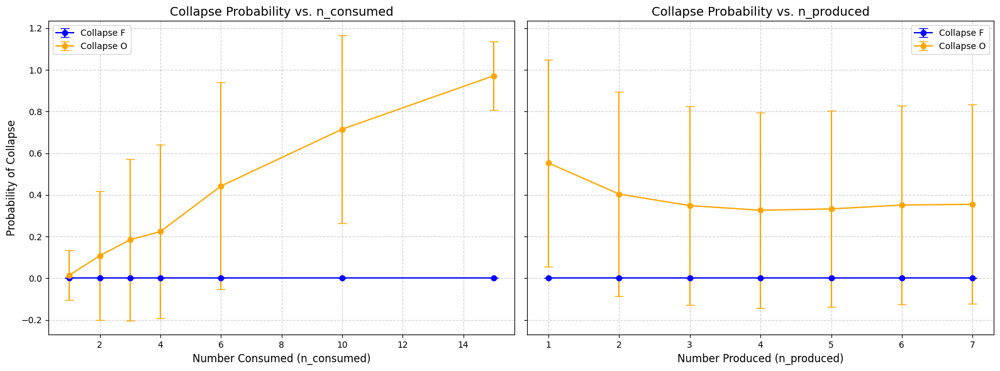

In [10]:

# Calculate probabilities and standard deviations for n_consumed
probabilities_consumed = (
    df_complete.groupby('n_consumed')
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        std_collapse_F=('collapse_F', lambda x: (x == 'yes').std()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        std_collapse_O=('collapse_O', lambda x: (x == 'yes').std())
    )
    .reset_index()
)

# Calculate probabilities and standard deviations for n_produced
probabilities_produced = (
    df_complete.groupby('n_produced')
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        std_collapse_F=('collapse_F', lambda x: (x == 'yes').std()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        std_collapse_O=('collapse_O', lambda x: (x == 'yes').std())
    )
    .reset_index()
)

# Create the figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Plot for n_consumed with error bars
axes[0].errorbar(
    probabilities_consumed['n_consumed'], probabilities_consumed['prob_collapse_F'], 
    yerr=probabilities_consumed['std_collapse_F'], label='Collapse F', 
    color='blue', marker='o', linestyle='-', capsize=5
)
axes[0].errorbar(
    probabilities_consumed['n_consumed'], probabilities_consumed['prob_collapse_O'], 
    yerr=probabilities_consumed['std_collapse_O'], label='Collapse O', 
    color='orange', marker='o', linestyle='-', capsize=5
)
axes[0].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
axes[0].set_ylabel('Probability of Collapse', fontsize=12)
axes[0].set_title('Collapse Probability vs. n_consumed', fontsize=14)
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle='--', alpha=0.6)

# Plot for n_produced with error bars
axes[1].errorbar(
    probabilities_produced['n_produced'], probabilities_produced['prob_collapse_F'], 
    yerr=probabilities_produced['std_collapse_F'], label='Collapse F', 
    color='blue', marker='o', linestyle='-', capsize=5
)
axes[1].errorbar(
    probabilities_produced['n_produced'], probabilities_produced['prob_collapse_O'], 
    yerr=probabilities_produced['std_collapse_O'], label='Collapse O', 
    color='orange', marker='o', linestyle='-', capsize=5
)
axes[1].set_xlabel('Number Produced (n_produced)', fontsize=12)
axes[1].set_title('Collapse Probability vs. n_produced', fontsize=14)
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle='--', alpha=0.6)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_1005213/3293337468.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '197
(0.00)' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_1005213/3293337468.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '211
(0.00)' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_1005213/3293337468.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '214
(0.00)' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  annotatio

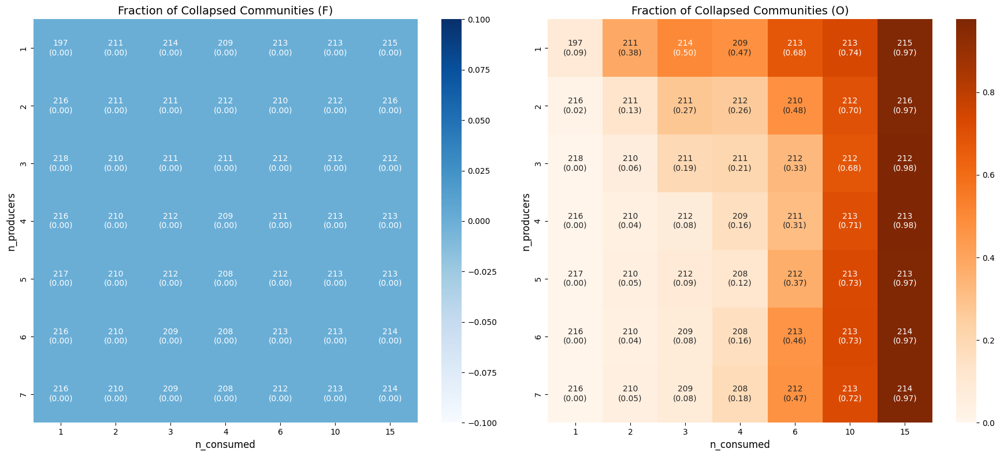

In [13]:
# Group by `n_consumed` and `n_produced` to calculate collapse probabilities and counts
probabilities_with_counts = (
    df_complete.groupby(['n_consumed', 'n_produced'])
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        count=('collapse_F', 'count')  # Add a count of points in each square
    )
    .reset_index()
)

# Pivot data for heatmaps
heatmap_data_F = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_F')
heatmap_data_O = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_O')
heatmap_counts = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='count')

# Create annotations combining counts and probabilities for F
annotations_F = heatmap_counts.copy()
for row in annotations_F.index:
    for col in annotations_F.columns:
        count = heatmap_counts.loc[row, col]
        prob_F = heatmap_data_F.loc[row, col] if pd.notnull(heatmap_data_F.loc[row, col]) else np.nan
        annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''

# Create annotations combining counts and probabilities for O
annotations_O = heatmap_counts.copy()
for row in annotations_O.index:
    for col in annotations_O.columns:
        count = heatmap_counts.loc[row, col]
        prob_O = heatmap_data_O.loc[row, col] if pd.notnull(heatmap_data_O.loc[row, col]) else np.nan
        annotations_O.loc[row, col] = f'{count}\n({prob_O:.2f})' if not pd.isnull(count) else ''

# Set up the figure for two heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap for Collapse F with annotations
sns.heatmap(
    heatmap_data_F, 
    ax=axes[0], 
    cmap='Blues', 
    annot=annotations_F,  # Overlay count and O probability annotations
    fmt='',  # Use raw string annotations
    cbar=True
)
axes[0].set_title('Fraction of Collapsed Communities (F)', fontsize=14)
axes[0].set_xlabel('n_consumed', fontsize=12)
axes[0].set_ylabel('n_producers', fontsize=12)

# Heatmap for Collapse O with annotations
sns.heatmap(
    heatmap_data_O, 
    ax=axes[1], 
    cmap='Oranges', 
    annot=annotations_O,  # Overlay count and F probability annotations
    fmt='',  # Use raw string annotations
    cbar=True
)
axes[1].set_title('Fraction of Collapsed Communities (O)', fontsize=14)
axes[1].set_xlabel('n_consumed', fontsize=12)
axes[1].set_ylabel('n_producers', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

/tmp/ipykernel_1005213/798392250.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=grouped, x='leakage', y='collapsed', ax=axes[0], inner='quartile', cut=0, scale='width', linewidth=1.5, palette="muted")
/tmp/ipykernel_1005213/798392250.py:16: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=grouped, x='leakage', y='collapsed', ax=axes[0], inner='quartile', cut=0, scale='width', linewidth=1.5, palette="muted")
/tmp/ipykernel_1005213/798392250.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=grouped, x='leakage', y='collapsed', ax=axes[0], size=6, alpha=0.7, ji

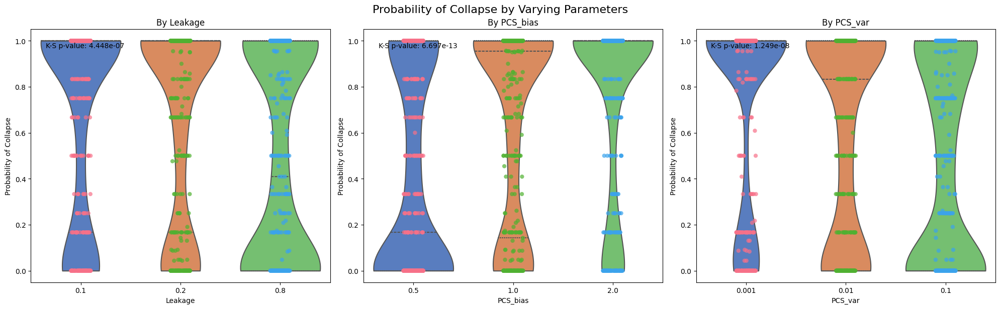

In [20]:
from scipy.stats import ks_2samp

# Add a column to indicate whether steady state was NOT reached
df_complete['collapsed'] = np.where(df_complete['collapse_O'] != 'yes', 1, 0)

# Group by the parameters and calculate the probability of not reaching steady state
grouped = df_complete.groupby(['n_consumed', 'n_produced', 'leakage', 'PCS_bias', 'PCS_var'])['collapsed'].mean().reset_index()

# Start the figure with 3 subplots in a single row
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 6))

# Custom color palette for scatter points
scatter_palette = sns.color_palette("husl", len(grouped['leakage'].unique()))

# Violin plot for leakage
sns.violinplot(data=grouped, x='leakage', y='collapsed', ax=axes[0], inner='quartile', cut=0, scale='width', linewidth=1.5, palette="muted")
sns.stripplot(data=grouped, x='leakage', y='collapsed', ax=axes[0], size=6, alpha=0.7, jitter=True, palette=scatter_palette)
axes[0].set_title("By Leakage")
axes[0].set_xlabel("Leakage")
axes[0].set_ylabel("Probability of Collapse")

# Perform Kolmogorov-Smirnov test for leakage
leakage_unique = grouped['leakage'].unique()
ks_results_leakage = []
for i in range(len(leakage_unique) - 1):
    ks_stat, p_value = ks_2samp(
        grouped[grouped['leakage'] == leakage_unique[i]]['collapsed'],
        grouped[grouped['leakage'] == leakage_unique[i + 1]]['collapsed']
    )
    ks_results_leakage.append((leakage_unique[i], leakage_unique[i + 1], ks_stat, p_value))
axes[0].text(0.05, 0.95, f'K-S p-value: {min([p for _, _, _, p in ks_results_leakage]):.3e}', transform=axes[0].transAxes, verticalalignment='top')

# Violin plot for PCS_bias
sns.violinplot(data=grouped, x='PCS_bias', y='collapsed', ax=axes[1], inner='quartile', cut=0, scale='width', linewidth=1.5, palette="muted")
sns.stripplot(data=grouped, x='PCS_bias', y='collapsed', ax=axes[1], size=6, alpha=0.7, jitter=True, palette=scatter_palette)
axes[1].set_title("By PCS_bias")
axes[1].set_xlabel("PCS_bias")
axes[1].set_ylabel("Probability of Collapse")

# Perform Kolmogorov-Smirnov test for PCS_bias
pcs_bias_unique = grouped['PCS_bias'].unique()
ks_results_pcs_bias = []
for i in range(len(pcs_bias_unique) - 1):
    ks_stat, p_value = ks_2samp(
        grouped[grouped['PCS_bias'] == pcs_bias_unique[i]]['collapsed'],
        grouped[grouped['PCS_bias'] == pcs_bias_unique[i + 1]]['collapsed']
    )
    ks_results_pcs_bias.append((pcs_bias_unique[i], pcs_bias_unique[i + 1], ks_stat, p_value))
axes[1].text(0.05, 0.95, f'K-S p-value: {min([p for _, _, _, p in ks_results_pcs_bias]):.3e}', transform=axes[1].transAxes, verticalalignment='top')

# Violin plot for PCS_var
sns.violinplot(data=grouped, x='PCS_var', y='collapsed', ax=axes[2], inner='quartile', cut=0, scale='width', linewidth=1.5, palette="muted")
sns.stripplot(data=grouped, x='PCS_var', y='collapsed', ax=axes[2], size=6, alpha=0.7, jitter=True, palette=scatter_palette)
axes[2].set_title("By PCS_var")
axes[2].set_xlabel("PCS_var")
axes[2].set_ylabel("Probability of Collapse")

# Perform Kolmogorov-Smirnov test for PCS_var
pcs_var_unique = grouped['PCS_var'].unique()
ks_results_pcs_var = []
for i in range(len(pcs_var_unique) - 1):
    ks_stat, p_value = ks_2samp(
        grouped[grouped['PCS_var'] == pcs_var_unique[i]]['collapsed'],
        grouped[grouped['PCS_var'] == pcs_var_unique[i + 1]]['collapsed']
    )
    ks_results_pcs_var.append((pcs_var_unique[i], pcs_var_unique[i + 1], ks_stat, p_value))
axes[2].text(0.05, 0.95, f'K-S p-value: {min([p for _, _, _, p in ks_results_pcs_var]):.3e}', transform=axes[2].transAxes, verticalalignment='top')

# Adjust layout
plt.tight_layout()
plt.suptitle("Probability of Collapse by Varying Parameters", fontsize=16, y=1.02)
plt.show()

In [7]:
df_filtered=df_complete[(df_complete['collapse_F']=='no')&(df_complete['collapse_O']=='no')]

In [8]:
len(df_filtered)

6422

## steady state statistics

In [34]:

# Define a function to check for steady state
def has_steady_state(time_series, threshold=1e-2, window_size=10):
    """
    Check if the time series has reached a steady state.
    
    Parameters:
    - time_series: array-like, the time series to check.
    - threshold: float, the maximum allowable change to consider steady.
    - window_size: int, the number of points to check for stability.
    
    Returns:
    - bool: True if the time series is steady, False otherwise.
    """
    # Ensure the time series is a numpy array
    time_series = np.array(time_series)[0]
    
    # Check if the time series is long enough
    if len(time_series) < window_size:
        return False  # Not enough points to determine steady state
    
    # Compute the absolute difference over the last window_size points
    differences = np.abs(time_series[-10]-time_series[-1])
    
    # Check if all differences are below the threshold
    return np.all(differences < threshold)

# Apply the steady-state check to the DataFrame
df_filtered['is_steady'] = df_filtered['CR_N_O'].apply(has_steady_state)

# Filter rows where steady state is reached
df_check = df_filtered[df_filtered['is_steady']].copy()

# Drop the helper column if not needed
df_check.drop(columns=['is_steady'], inplace=True)

# Output the filtered DataFrame
len(df_check)

/tmp/ipykernel_1005213/4017871636.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['is_steady'] = df_filtered['CR_N_O'].apply(has_steady_state)


2171

/tmp/ipykernel_1005213/436883723.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=grouped, x='leakage', y='not_steady', ax=axes[0, 1], palette='winter')
/tmp/ipykernel_1005213/436883723.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=grouped, x='PCS_bias', y='not_steady', ax=axes[1, 0], palette='summer')
/tmp/ipykernel_1005213/436883723.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=grouped, x='PCS_var', y='not_steady', ax=axes[1, 1], palette='spring')


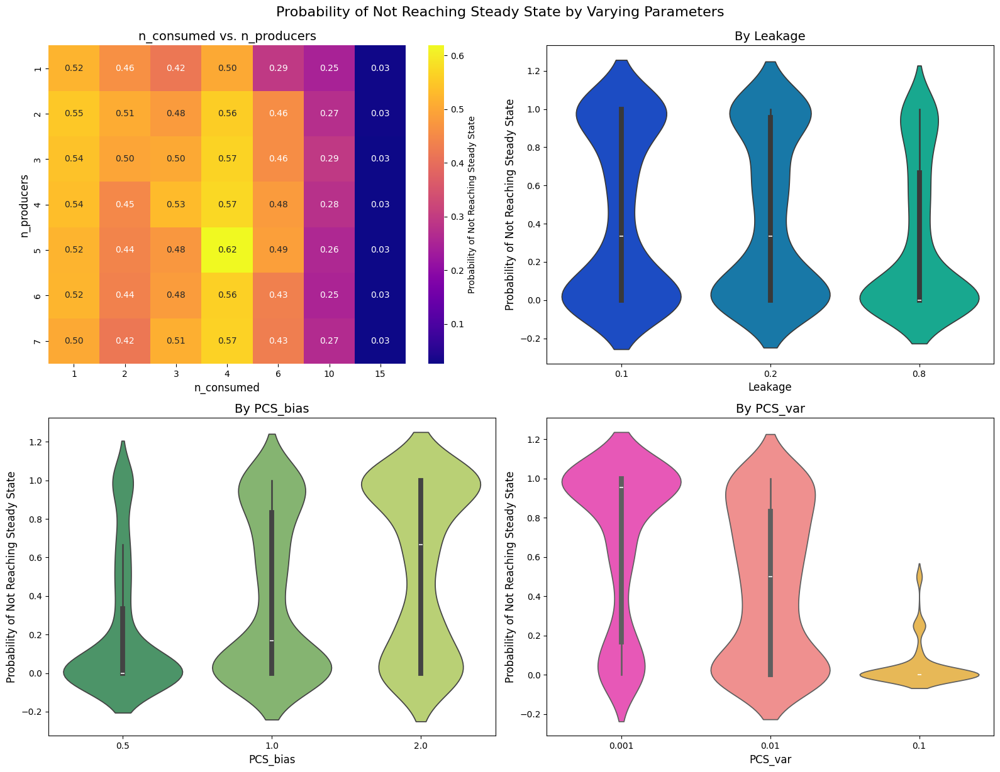

In [33]:
# Add a column to indicate whether steady state was NOT reached
df_complete['not_steady'] = ~df_complete['is_steady']

# Group by the parameters and calculate the probability of not reaching steady state
grouped = df_complete.groupby(['n_consumed', 'n_produced', 'leakage', 'PCS_bias', 'PCS_var'])['not_steady'].mean().reset_index()

# Prepare heatmap data for n_consumed vs. n_produced
heatmap_data = grouped.groupby(['n_produced', 'n_consumed'])['not_steady'].mean().unstack()

# Start the figure
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# Heatmap for n_consumed vs. n_produced
sns.heatmap(
    heatmap_data, 
    cmap="plasma", 
    annot=True, 
    fmt=".2f", 
    cbar_kws={'label': 'Probability of Not Reaching Steady State'},
    ax=axes[0, 0]
)
axes[0, 0].set_title("n_consumed vs. n_producers", fontsize=14)
axes[0, 0].set_ylabel("n_producers", fontsize=12)
axes[0, 0].set_xlabel("n_consumed", fontsize=12)

# Violin plot for leakage
sns.violinplot(data=grouped, x='leakage', y='not_steady', ax=axes[0, 1], palette='winter')
axes[0, 1].set_title("By Leakage", fontsize=14)
axes[0, 1].set_xlabel("Leakage", fontsize=12)
axes[0, 1].set_ylabel("Probability of Not Reaching Steady State", fontsize=12)

# Violin plot for PCS_bias
sns.violinplot(data=grouped, x='PCS_bias', y='not_steady', ax=axes[1, 0], palette='summer')
axes[1, 0].set_title("By PCS_bias", fontsize=14)
axes[1, 0].set_xlabel("PCS_bias", fontsize=12)
axes[1, 0].set_ylabel("Probability of Not Reaching Steady State", fontsize=12)

# Violin plot for PCS_var
sns.violinplot(data=grouped, x='PCS_var', y='not_steady', ax=axes[1, 1], palette='spring')
axes[1, 1].set_title("By PCS_var", fontsize=14)
axes[1, 1].set_xlabel("PCS_var", fontsize=12)
axes[1, 1].set_ylabel("Probability of Not Reaching Steady State", fontsize=12)

# Adjust layout
plt.tight_layout()
plt.suptitle("Probability of Not Reaching Steady State by Varying Parameters", fontsize=16, y=1.02)
plt.show()

## save for future imports

In [3]:
df_check=pd.read_pickle('path to aux_wm_steady_noncollapsed.pkl')

## check collapse statistics

In [6]:

# Calculate probabilities and standard deviations for n_consumed
probabilities_consumed = (
    df_complete.groupby('n_consumed')
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        std_collapse_F=('collapse_F', lambda x: (x == 'yes').std()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        std_collapse_O=('collapse_O', lambda x: (x == 'yes').std())
    )
    .reset_index()
)

# Calculate probabilities and standard deviations for n_produced
probabilities_produced = (
    df_complete.groupby('n_produced')
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        std_collapse_F=('collapse_F', lambda x: (x == 'yes').std()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        std_collapse_O=('collapse_O', lambda x: (x == 'yes').std())
    )
    .reset_index()
)

# Create the figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Plot for n_consumed with error bars
axes[0].errorbar(
    probabilities_consumed['n_consumed'], probabilities_consumed['prob_collapse_F'], 
    yerr=probabilities_consumed['std_collapse_F'], label='Collapse F', 
    color='blue', marker='o', linestyle='-', capsize=5
)
axes[0].errorbar(
    probabilities_consumed['n_consumed'], probabilities_consumed['prob_collapse_O'], 
    yerr=probabilities_consumed['std_collapse_O'], label='Collapse O', 
    color='orange', marker='o', linestyle='-', capsize=5
)
axes[0].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
axes[0].set_ylabel('Probability of Collapse', fontsize=12)
axes[0].set_title('Collapse Probability vs. n_consumed', fontsize=14)
axes[0].legend(fontsize=10)
axes[0].grid(True, linestyle='--', alpha=0.6)

# Plot for n_produced with error bars
axes[1].errorbar(
    probabilities_produced['n_produced'], probabilities_produced['prob_collapse_F'], 
    yerr=probabilities_produced['std_collapse_F'], label='Collapse F', 
    color='blue', marker='o', linestyle='-', capsize=5
)
axes[1].errorbar(
    probabilities_produced['n_produced'], probabilities_produced['prob_collapse_O'], 
    yerr=probabilities_produced['std_collapse_O'], label='Collapse O', 
    color='orange', marker='o', linestyle='-', capsize=5
)
axes[1].set_xlabel('Number Produced (n_produced)', fontsize=12)
axes[1].set_title('Collapse Probability vs. n_produced', fontsize=14)
axes[1].legend(fontsize=10)
axes[1].grid(True, linestyle='--', alpha=0.6)

# Adjust layout and show plot
plt.tight_layout()
plt.show()

NameError: name 'df_complete' is not defined

/tmp/ipykernel_4137239/909190587.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '197
(0.00)' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/909190587.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '211
(0.00)' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/909190587.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '214
(0.00)' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  annotations_

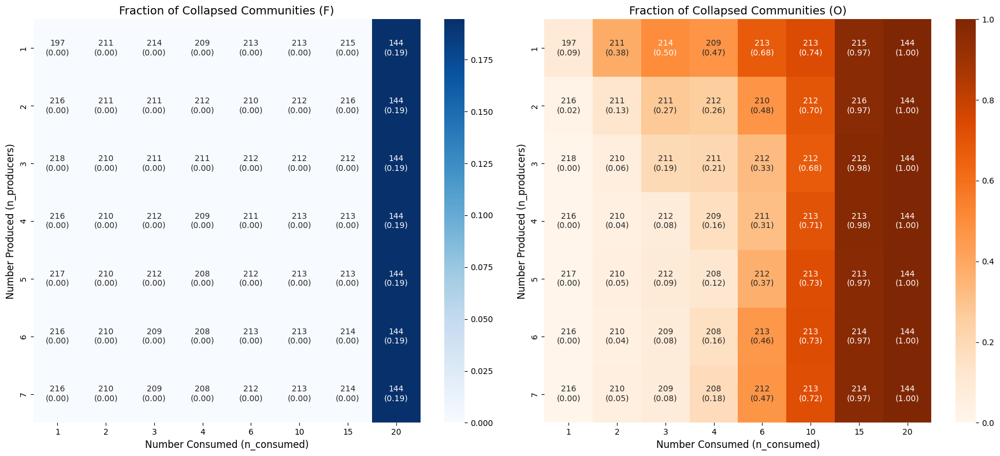

In [12]:
# Group by `n_consumed` and `n_produced` to calculate collapse probabilities and counts
probabilities_with_counts = (
    df_complete.groupby(['n_consumed', 'n_produced'])
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        count=('collapse_F', 'count')  # Add a count of points in each square
    )
    .reset_index()
)

# Pivot data for heatmaps
heatmap_data_F = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_F')
heatmap_data_O = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_O')
heatmap_counts = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='count')

# Create annotations combining counts and probabilities for F
annotations_F = heatmap_counts.copy()
for row in annotations_F.index:
    for col in annotations_F.columns:
        count = heatmap_counts.loc[row, col]
        prob_F = heatmap_data_F.loc[row, col] if pd.notnull(heatmap_data_F.loc[row, col]) else np.nan
        annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''

# Create annotations combining counts and probabilities for O
annotations_O = heatmap_counts.copy()
for row in annotations_O.index:
    for col in annotations_O.columns:
        count = heatmap_counts.loc[row, col]
        prob_O = heatmap_data_O.loc[row, col] if pd.notnull(heatmap_data_O.loc[row, col]) else np.nan
        annotations_O.loc[row, col] = f'{count}\n({prob_O:.2f})' if not pd.isnull(count) else ''

# Set up the figure for two heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap for Collapse F with annotations
sns.heatmap(
    heatmap_data_F, 
    ax=axes[0], 
    cmap='Blues', 
    annot=annotations_F,  # Overlay count and O probability annotations
    fmt='',  # Use raw string annotations
    cbar=True
)
axes[0].set_title('Fraction of Collapsed Communities (F)', fontsize=14)
axes[0].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
axes[0].set_ylabel('Number Produced (n_producers)', fontsize=12)

# Heatmap for Collapse O with annotations
sns.heatmap(
    heatmap_data_O, 
    ax=axes[1], 
    cmap='Oranges', 
    annot=annotations_O,  # Overlay count and F probability annotations
    fmt='',  # Use raw string annotations
    cbar=True
)
axes[1].set_title('Fraction of Collapsed Communities (O)', fontsize=14)
axes[1].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
axes[1].set_ylabel('Number Produced (n_producers)', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

/tmp/ipykernel_4137239/500794329.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '83.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/500794329.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '24.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/500794329.py:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '9.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  anno

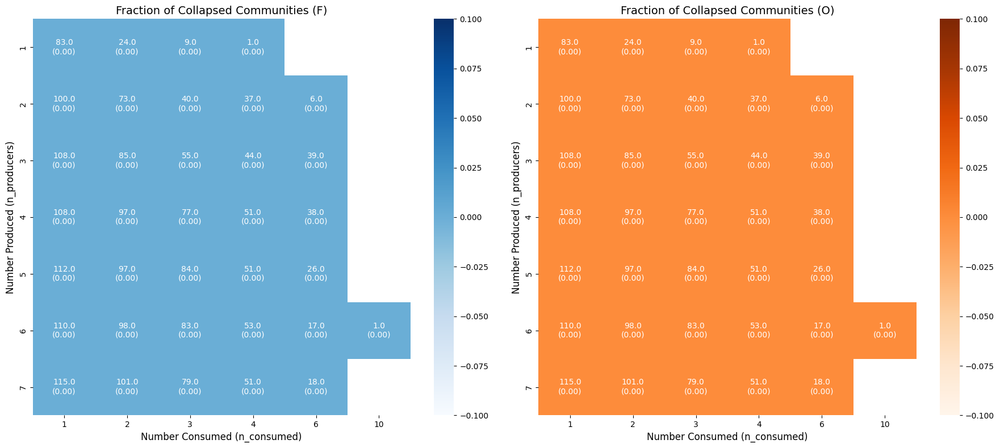

In [13]:
# check which ones have converged
# Group by `n_consumed` and `n_produced` to calculate collapse probabilities and counts
probabilities_with_counts = (
    df_check.groupby(['n_consumed', 'n_produced'])
    .agg(
        prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
        prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
        count=('collapse_F', 'count')  # Add a count of points in each square
    )
    .reset_index()
)

# Pivot data for heatmaps
heatmap_data_F = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_F')
heatmap_data_O = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_O')
heatmap_counts = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='count')

# Create annotations combining counts and probabilities for F
annotations_F = heatmap_counts.copy()
for row in annotations_F.index:
    for col in annotations_F.columns:
        count = heatmap_counts.loc[row, col]
        prob_F = heatmap_data_F.loc[row, col] if pd.notnull(heatmap_data_F.loc[row, col]) else np.nan
        annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''

# Create annotations combining counts and probabilities for O
annotations_O = heatmap_counts.copy()
for row in annotations_O.index:
    for col in annotations_O.columns:
        count = heatmap_counts.loc[row, col]
        prob_O = heatmap_data_O.loc[row, col] if pd.notnull(heatmap_data_O.loc[row, col]) else np.nan
        annotations_O.loc[row, col] = f'{count}\n({prob_O:.2f})' if not pd.isnull(count) else ''

# Set up the figure for two heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap for Collapse F with annotations
sns.heatmap(
    heatmap_data_F, 
    ax=axes[0], 
    cmap='Blues', 
    annot=annotations_F,  # Overlay count and O probability annotations
    fmt='',  # Use raw string annotations
    cbar=True
)
axes[0].set_title('Fraction of Collapsed Communities (F)', fontsize=14)
axes[0].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
axes[0].set_ylabel('Number Produced (n_producers)', fontsize=12)

# Heatmap for Collapse O with annotations
sns.heatmap(
    heatmap_data_O, 
    ax=axes[1], 
    cmap='Oranges', 
    annot=annotations_O,  # Overlay count and F probability annotations
    fmt='',  # Use raw string annotations
    cbar=True
)
axes[1].set_title('Fraction of Collapsed Communities (O)', fontsize=14)
axes[1].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
axes[1].set_ylabel('Number Produced (n_producers)', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

## heatmap by leakage to check there is a min number of replicas for spatial simulation

/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '15.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '6.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  an

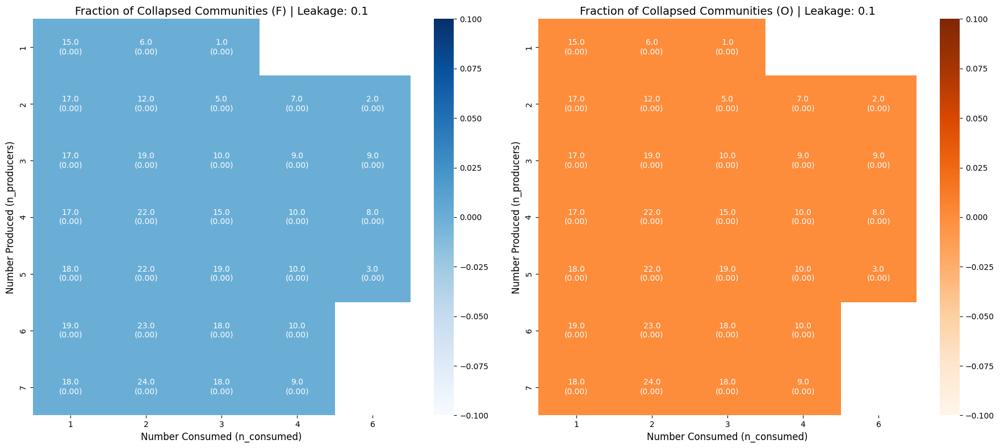

/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '33.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '9.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  an

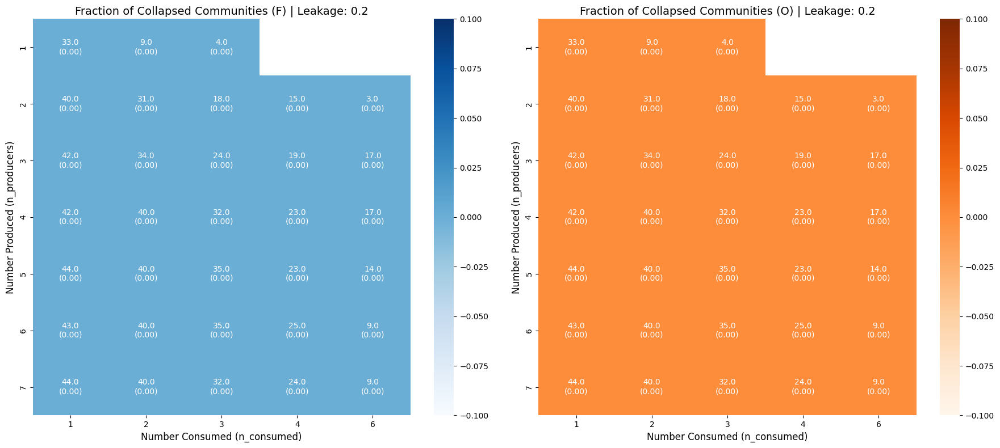

/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '35.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '9.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''
/tmp/ipykernel_4137239/3222799889.py:31: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4.0
(0.00)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  an

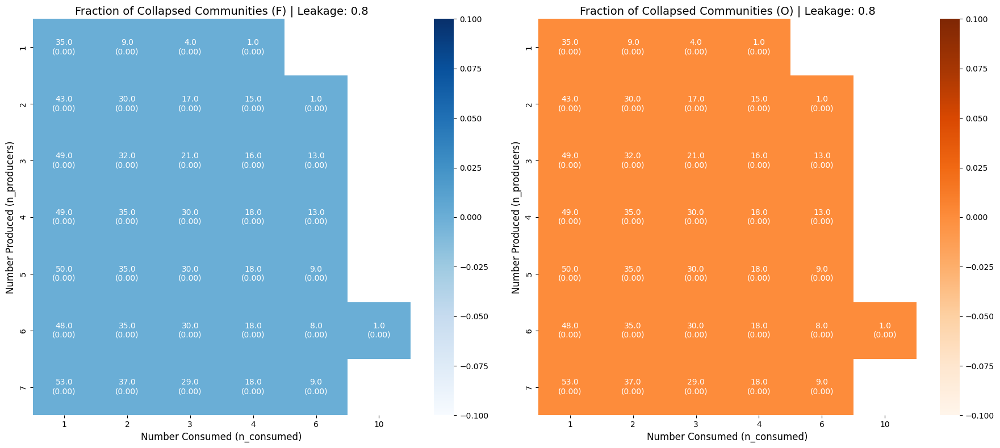

In [14]:
# Get the unique values of leakage
unique_leakage_values = df_check['leakage'].unique()

# Loop over each unique leakage value and create individual plots
for leakage_value in unique_leakage_values:
    # Filter the DataFrame for the current leakage value
    df_filtered = df_check[df_check['leakage'] == leakage_value]
    
    # Group by `n_consumed` and `n_produced` to calculate collapse probabilities and counts
    probabilities_with_counts = (
        df_filtered.groupby(['n_consumed', 'n_produced'])
        .agg(
            prob_collapse_F=('collapse_F', lambda x: (x == 'yes').mean()),
            prob_collapse_O=('collapse_O', lambda x: (x == 'yes').mean()),
            count=('collapse_F', 'count')  # Add a count of points in each square
        )
        .reset_index()
    )

    # Pivot data for heatmaps
    heatmap_data_F = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_F')
    heatmap_data_O = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='prob_collapse_O')
    heatmap_counts = probabilities_with_counts.pivot(index='n_produced', columns='n_consumed', values='count')

    # Create annotations combining counts and probabilities for F
    annotations_F = heatmap_counts.copy()
    for row in annotations_F.index:
        for col in annotations_F.columns:
            count = heatmap_counts.loc[row, col]
            prob_F = heatmap_data_F.loc[row, col] if pd.notnull(heatmap_data_F.loc[row, col]) else np.nan
            annotations_F.loc[row, col] = f'{count}\n({prob_F:.2f})' if not pd.isnull(count) else ''

    # Create annotations combining counts and probabilities for O
    annotations_O = heatmap_counts.copy()
    for row in annotations_O.index:
        for col in annotations_O.columns:
            count = heatmap_counts.loc[row, col]
            prob_O = heatmap_data_O.loc[row, col] if pd.notnull(heatmap_data_O.loc[row, col]) else np.nan
            annotations_O.loc[row, col] = f'{count}\n({prob_O:.2f})' if not pd.isnull(count) else ''

    # Set up the figure for two heatmaps
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Heatmap for Collapse F with annotations
    sns.heatmap(
        heatmap_data_F, 
        ax=axes[0], 
        cmap='Blues', 
        annot=annotations_F,  # Overlay count and O probability annotations
        fmt='',  # Use raw string annotations
        cbar=True
    )
    axes[0].set_title(f'Fraction of Collapsed Communities (F) | Leakage: {leakage_value}', fontsize=14)
    axes[0].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
    axes[0].set_ylabel('Number Produced (n_producers)', fontsize=12)

    # Heatmap for Collapse O with annotations
    sns.heatmap(
        heatmap_data_O, 
        ax=axes[1], 
        cmap='Oranges', 
        annot=annotations_O,  # Overlay count and F probability annotations
        fmt='',  # Use raw string annotations
        cbar=True
    )
    axes[1].set_title(f'Fraction of Collapsed Communities (O) | Leakage: {leakage_value}', fontsize=14)
    axes[1].set_xlabel('Number Consumed (n_consumed)', fontsize=12)
    axes[1].set_ylabel('Number Produced (n_producers)', fontsize=12)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

## Procede only with non collapsed communities

In [4]:
df_filtered=df_check.copy()

In [5]:
len(df_filtered)

2171

In [26]:
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_null_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    A_matrix = np.array(A_matrix)  # Convert the list to a numpy array
    num_null = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] == 0)
    return num_null
    
# Avoid SettingWithCopyWarning by using .loc
df_filtered.loc[:, 'connectivity_F'] = df_filtered['A_f'].apply(lambda x: 1 - count_null_entries(x[0]) / 56)
df_filtered.loc[:, 'connectivity_O'] = df_filtered['A_O'].apply(lambda x: 1 - count_null_entries(x) / 56)

In [27]:
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_pos_neg_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    A_matrix = np.array(A_matrix)  # Convert the list to a numpy array
    num_positive = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] > 0)
    num_negative = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] < 0)
    return [num_positive, num_negative]

# Apply the function to the 'A' column and create a new column 'pos_neg_counts_F'
df_filtered.loc[:, 'pos_neg_counts_F'] = df_filtered['A_f'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix[0]))

# Calculate the fraction of positive and negative values for F
df_filtered.loc[:, 'fraction_pos_F'] = df_filtered.apply(
    lambda row: row['pos_neg_counts_F'][0] / (56 * row['connectivity_F']) if row['connectivity_F'] != 0 else np.nan, 
    axis=1
)
df_filtered.loc[:, 'fraction_neg_F'] = df_filtered.apply(
    lambda row: row['pos_neg_counts_F'][1] / (56 * row['connectivity_F']) if row['connectivity_F'] != 0 else np.nan, 
    axis=1
)



# Apply the function to the 'A' column and create a new column 'pos_neg_counts_O'
df_filtered.loc[:, 'pos_neg_counts_O'] = df_filtered['A_O'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))

# Calculate the fraction of positive and negative values for O
df_filtered.loc[:, 'fraction_pos_O'] = df_filtered.apply(
    lambda row: row['pos_neg_counts_O'][0] / (56 * row['connectivity_O']) if row['connectivity_O'] != 0 else np.nan, 
    axis=1
)
df_filtered.loc[:, 'fraction_neg_O'] = df_filtered.apply(
    lambda row: row['pos_neg_counts_O'][1] / (56 * row['connectivity_O']) if row['connectivity_O'] != 0 else np.nan, 
    axis=1
)


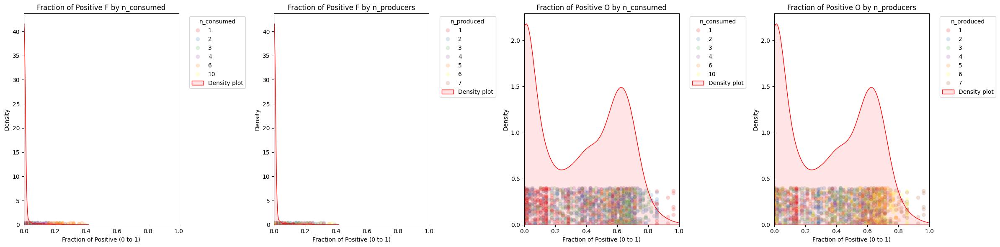

In [32]:
# Ensure 'sparsity' and 'n_resources' are categorical
df_filtered['n_consumed'] = df_filtered['n_consumed'].astype('category')
df_complete['n_consumed'] = df_complete['n_consumed'].astype('category')

# Define color palettes
sparsity_palette = sns.color_palette("Set1", n_colors=df_filtered['n_consumed'].nunique())
n_produced_palette = sns.color_palette("Set1", n_colors=df_filtered['n_produced'].nunique())
sparsity_palette_f = sns.color_palette("Set1", n_colors=df_filtered['n_consumed'].nunique())
n_produced_palette_f = sns.color_palette("Set1", n_colors=df_filtered['n_produced'].nunique())

# Create the figure with 2 subplots
fig, axs = plt.subplots(1, 4, figsize=(24, 6))

jitter_strength = 0.2
y_jitter = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_filtered))
y_jitter_f = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_filtered))

# First plot: scatter plot colored by sparsity
sns.scatterplot(ax=axs[0], x='fraction_pos_F', y=y_jitter_f,  # Y-coordinate set to align horizontally
                data=df_filtered, hue='n_consumed', palette=sparsity_palette_f, 
                s=50, alpha=0.2, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0], x='fraction_pos_F', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.1)
axs[0].set_title('Fraction of Positive F by n_consumed')
axs[0].set_xlabel('Fraction of Positive (0 to 1)')
axs[0].set_xlim(0, 1)
axs[0].legend(title='n_consumed', bbox_to_anchor=(1.05, 1), loc='upper left')

# First plot: scatter plot colored by sparsity
sns.scatterplot(ax=axs[1], x='fraction_pos_F', y=y_jitter_f,  # Y-coordinate set to align horizontally
                data=df_filtered, hue='n_produced', palette=n_produced_palette_f, 
                s=50, alpha=0.2, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1], x='fraction_pos_F', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.1)
axs[1].set_title('Fraction of Positive F by n_producers')
axs[1].set_xlabel('Fraction of Positive (0 to 1)')
axs[1].set_xlim(0, 1)
axs[1].legend(title='n_produced', bbox_to_anchor=(1.05, 1), loc='upper left')

# First plot: scatter plot colored by sparsity
sns.scatterplot(ax=axs[2], x='fraction_pos_O', y=y_jitter,  # Y-coordinate set to align horizontally
                data=df_filtered, hue='n_consumed', palette=sparsity_palette, 
                s=50, alpha=0.2, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[2], x='fraction_pos_O', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.1)
axs[2].set_title('Fraction of Positive O by n_consumed')
axs[2].set_xlabel('Fraction of Positive (0 to 1)')
axs[2].set_xlim(0, 1)
axs[2].legend(title='n_consumed', bbox_to_anchor=(1.05, 1), loc='upper left')

# First plot: scatter plot colored by sparsity
sns.scatterplot(ax=axs[3], x='fraction_pos_O', y=y_jitter,  # Y-coordinate set to align horizontally
                data=df_filtered, hue='n_produced', palette=n_produced_palette, 
                s=50, alpha=0.2, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[3], x='fraction_pos_O', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.1)
axs[3].set_title('Fraction of Positive O by n_producers')
axs[3].set_xlabel('Fraction of Positive (0 to 1)')
axs[3].set_xlim(0, 1)
axs[3].legend(title='n_produced', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [33]:
# calculate averages of absolute values

# Calculate absolute averages for df_filtered
df_filtered.loc[:, 'g_abs_avg_F'] = df_filtered['g0_F'].apply(lambda x: np.mean(np.abs(x)))
df_filtered.loc[:, 'A_abs_avg_F'] = df_filtered['A_f'].apply(lambda x: np.mean(np.abs(x)))
df_filtered.loc[:, 'g_abs_avg_O'] = df_filtered['g0_O'].apply(lambda x: np.mean(np.abs(x)))
df_filtered.loc[:, 'A_abs_avg_O'] = df_filtered['A_O'].apply(lambda x: np.mean(np.abs(x)))


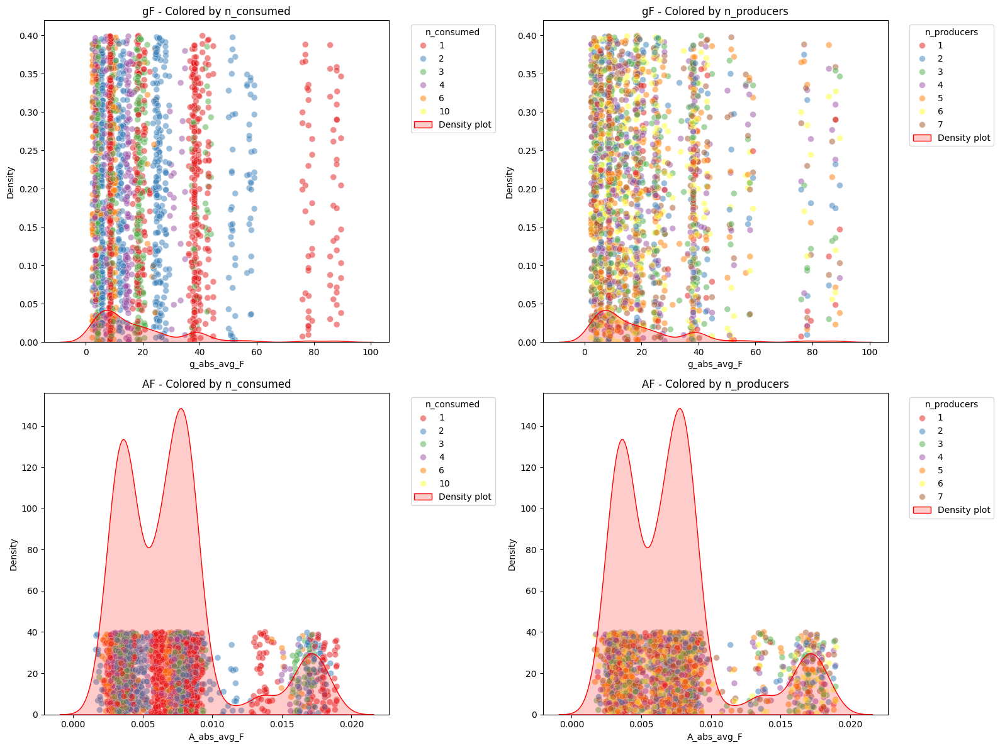

In [35]:

# Create the figure with 2x2 subplots (adjusted since we only need four subplots)
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Add jitter for y-axis alignment
jitter_strength = 0.1
y_jitter = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_filtered))

# First plot: g_abs_avg by sparsity
sns.scatterplot(ax=axs[0, 0], x='g_abs_avg_F', y=y_jitter_f, data=df_filtered, hue='n_consumed', 
                palette=sparsity_palette_f, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0, 0], x='g_abs_avg_F', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[0, 0].set_title('gF - Colored by n_consumed')
axs[0, 0].set_xlabel('g_abs_avg_F')
axs[0, 0].legend(title='n_consumed', bbox_to_anchor=(1.05, 1), loc='upper left')

# Second plot: g_abs_avg by number of resources
sns.scatterplot(ax=axs[0, 1], x='g_abs_avg_F', y=y_jitter_f, data=df_filtered, hue='n_produced', 
                palette=n_produced_palette_f, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0, 1], x='g_abs_avg_F', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[0, 1].set_title('gF - Colored by n_producers')
axs[0, 1].set_xlabel('g_abs_avg_F')
axs[0, 1].legend(title='n_producers', bbox_to_anchor=(1.05, 1), loc='upper left')

# Third plot: A_abs_avg by sparsity
sns.scatterplot(ax=axs[1, 0], x='A_abs_avg_F', y=y_jitter_f*100, data=df_filtered, hue='n_consumed', 
                palette=sparsity_palette_f, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1, 0], x='A_abs_avg_F', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[1, 0].set_title('AF - Colored by n_consumed')
axs[1, 0].set_xlabel('A_abs_avg_F')
axs[1, 0].legend(title='n_consumed', bbox_to_anchor=(1.05, 1), loc='upper left')

# Fourth plot: A_abs_avg by number of resources
sns.scatterplot(ax=axs[1, 1], x='A_abs_avg_F', y=y_jitter_f*100, data=df_filtered, hue='n_produced', 
                palette=n_produced_palette_f, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1, 1], x='A_abs_avg_F', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[1, 1].set_title('AF - Colored by n_producers')
axs[1, 1].set_xlabel('A_abs_avg_F')
axs[1, 1].legend(title='n_producers', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

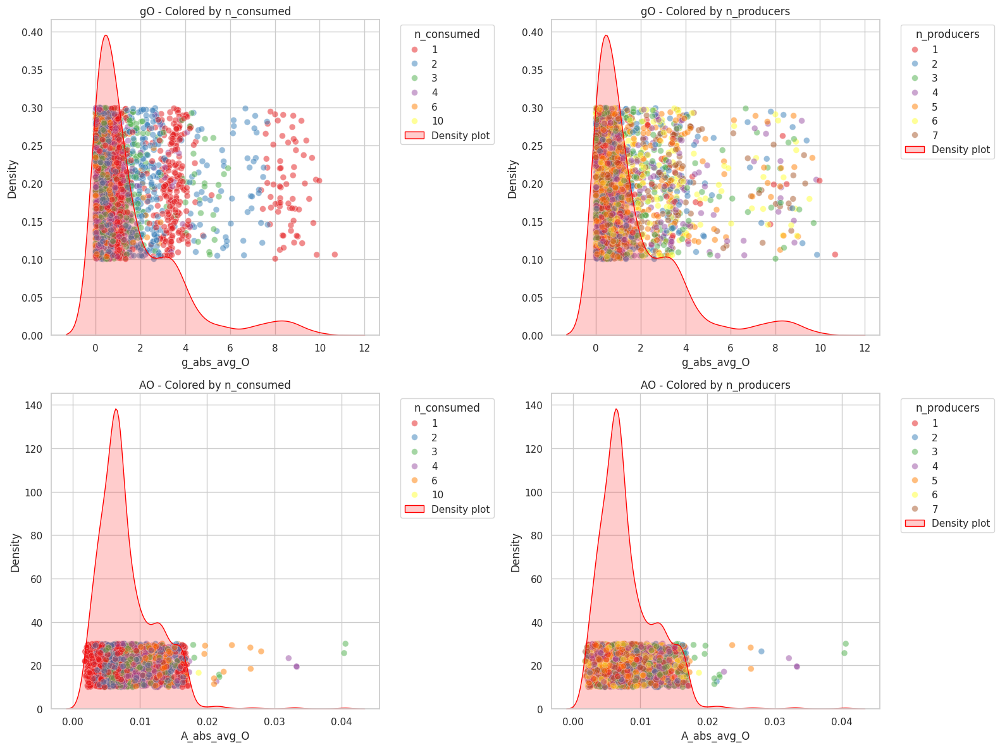

In [71]:

# Create the figure with 2x2 subplots (adjusted since we only need four subplots)
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Add jitter for y-axis alignment
jitter_strength = 0.1
y_jitter = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_filtered))

# First plot: g_abs_avg by sparsity
sns.scatterplot(ax=axs[0, 0], x='g_abs_avg_O', y=y_jitter, data=df_filtered, hue='n_consumed', 
                palette=sparsity_palette, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0, 0], x='g_abs_avg_O', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[0, 0].set_title('gO - Colored by n_consumed')
axs[0, 0].set_xlabel('g_abs_avg_O')

axs[0, 0].legend(title='n_consumed', bbox_to_anchor=(1.05, 1), loc='upper left')

# Second plot: g_abs_avg by number of resources
sns.scatterplot(ax=axs[0, 1], x='g_abs_avg_O', y=y_jitter, data=df_filtered, hue='n_produced', 
                palette=n_produced_palette, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0, 1], x='g_abs_avg_O', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[0, 1].set_title('gO - Colored by n_producers')
axs[0, 1].set_xlabel('g_abs_avg_O')

axs[0, 1].legend(title='n_producers', bbox_to_anchor=(1.05, 1), loc='upper left')

# Third plot: A_abs_avg by sparsity
sns.scatterplot(ax=axs[1, 0], x='A_abs_avg_O', y=y_jitter*100, data=df_filtered, hue='n_consumed', 
                palette=sparsity_palette, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1, 0], x='A_abs_avg_O', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[1, 0].set_title('AO - Colored by n_consumed')
axs[1, 0].set_xlabel('A_abs_avg_O')

axs[1, 0].legend(title='n_consumed', bbox_to_anchor=(1.05, 1), loc='upper left')

# Fourth plot: A_abs_avg by number of resources
sns.scatterplot(ax=axs[1, 1], x='A_abs_avg_O', y=y_jitter*100, data=df_filtered, hue='n_produced', 
                palette=n_produced_palette, s=50, alpha=0.5, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1, 1], x='A_abs_avg_O', data=df_filtered, color='red', 
            label='Density plot', fill=True, alpha=0.2)
axs[1, 1].set_title('AO - Colored by n_producers')
axs[1, 1].set_xlabel('A_abs_avg_O')

axs[1, 1].legend(title='n_producers', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [36]:
g_values = df_filtered['g0_F'].apply(lambda x: x[0]).explode().reset_index(drop=True).astype(float)  # Flatten all 'g' vectors
A_values = df_filtered['A_f'].apply(lambda x: x[0].flatten()).explode().reset_index(drop=True).astype(float)

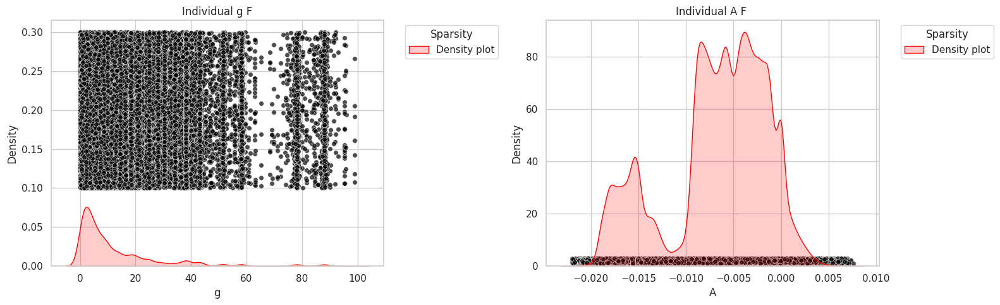

In [73]:


# Expand other columns for plotting alignment
df_g = pd.DataFrame({
    'g_abs': g_values

   
})

df_A = pd.DataFrame({
    'A_abs': A_values
   
})


# Create the figure with 2x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Add jitter for y-axis alignment
jitter_strength = 0.1
y_jitter_g = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_g))
y_jitter_A = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_A))

# First plot: Individual g_abs by sparsity
sns.scatterplot(ax=axs[ 0], x='g_abs', y=y_jitter_g, data=df_g, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0], x='g_abs', data=df_g, color='red', label='Density plot', fill=True, alpha=0.2)
axs[0].set_title('Individual g F')
axs[0].set_xlabel('g')
axs[0].legend(title='Sparsity', bbox_to_anchor=(1.05, 1), loc='upper left')


# Third plot: Individual A_abs by sparsity
sns.scatterplot(ax=axs[1], x='A_abs', y=y_jitter_A * 10, data=df_A, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1], x='A_abs', data=df_A, color='red', label='Density plot', fill=True, alpha=0.2)
axs[1].set_title('Individual A F ')
axs[1].set_xlabel('A')
axs[1].legend(title='Sparsity', bbox_to_anchor=(1.05, 1), loc='upper left')



# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [37]:
g_values = df_filtered['g0_O'].apply(lambda x: x[0]).explode().reset_index(drop=True).astype(float)  # Flatten all 'g' vectors
A_values = df_filtered['A_O'].apply(lambda x: x[0].flatten()).explode().reset_index(drop=True).astype(float)


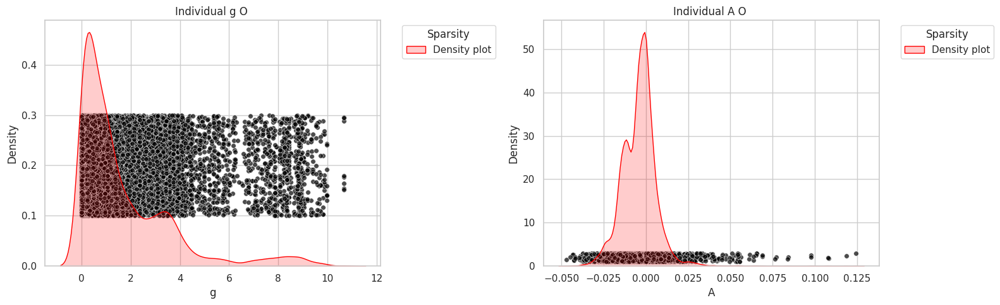

In [75]:

# Expand other columns for plotting alignment
df_g = pd.DataFrame({
    'g_abs': g_values

   
})

df_A = pd.DataFrame({
    'A_abs': A_values
   
})


# Create the figure with 2x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Add jitter for y-axis alignment
jitter_strength = 0.1
y_jitter_g = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_g))
y_jitter_A = np.random.uniform(0.2 - jitter_strength, 0.2 + jitter_strength, size=len(df_A))

# First plot: Individual g_abs by sparsity
sns.scatterplot(ax=axs[ 0], x='g_abs', y=y_jitter_g, data=df_g, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0], x='g_abs', data=df_g, color='red', label='Density plot', fill=True, alpha=0.2)
axs[0].set_title('Individual g O ')
axs[0].set_xlabel('g')
axs[0].legend(title='Sparsity', bbox_to_anchor=(1.05, 1), loc='upper left')


# Third plot: Individual A_abs by sparsity
sns.scatterplot(ax=axs[1], x='A_abs', y=y_jitter_A * 10, data=df_A, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1], x='A_abs', data=df_A, color='red', label='Density plot', fill=True, alpha=0.2)
axs[1].set_title('Individual A O ')
axs[1].set_xlabel('A')
axs[1].legend(title='Sparsity', bbox_to_anchor=(1.05, 1), loc='upper left')



# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [38]:
df_filtered['A/sigma_g_F'] = df_filtered['A_abs_avg_F'] / df_filtered['g0_F'].apply(np.std)
df_filtered['A/g_F'] = df_filtered['A_abs_avg_F'] / df_filtered['g_abs_avg_F']

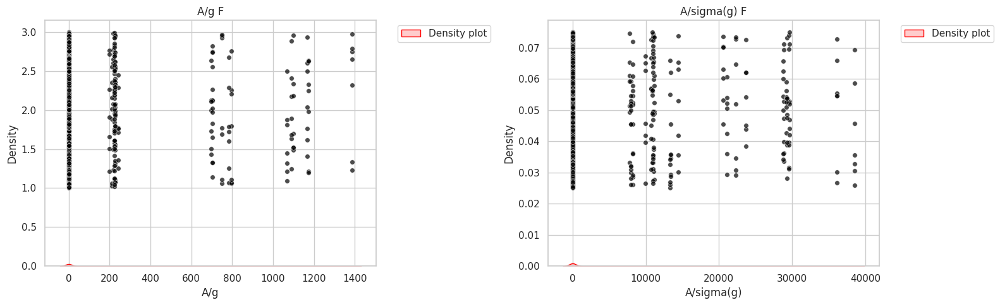

In [77]:
# Calculate new metric (absolute average of A divided by variance of g)
g_values = df_complete['A/g_F']
gvar_values = df_complete['A/sigma_g_F']

# Expand other columns for plotting alignment
df_g = pd.DataFrame({
    'A/g': g_values

   
})

df_varg = pd.DataFrame({
    'A/sigma(g)': gvar_values
   
})


# Create the figure with 2x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Add jitter for y-axis alignment
jitter_strength_g = 1
jitter_strength_gvar = 0.0025
y_jitter_g = np.random.uniform(2 - jitter_strength_g, 2 + jitter_strength_g, size=len(df_g))
y_jitter_A = np.random.uniform(0.005 - jitter_strength_gvar, 0.005 + jitter_strength_gvar, size=len(df_varg))

# First plot: Individual g_abs by sparsity
sns.scatterplot(ax=axs[ 0], x='A/g', y=y_jitter_g, data=df_g, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0], x='A/g', data=df_g, color='red', label='Density plot', fill=True, alpha=0.2)
axs[0].set_title('A/g F')
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')


# Third plot: Individual A_abs by sparsity
sns.scatterplot(ax=axs[1], x='A/sigma(g)', y=y_jitter_A * 10, data=df_varg, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1], x='A/sigma(g)', data=df_varg, color='red', label='Density plot', fill=True, alpha=0.2)
axs[1].set_title('A/sigma(g) F')
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')



# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [39]:
df_filtered['A/sigma_g_O'] = df_filtered['A_abs_avg_O'] / df_filtered['g0_O'].apply(np.std)
df_filtered['A/g_O'] = df_filtered['A_abs_avg_O'] / df_filtered['g_abs_avg_O']

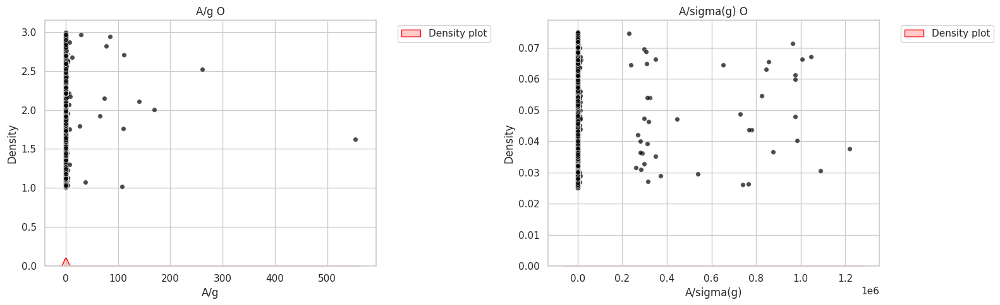

In [79]:
# Calculate new metric (absolute average of A divided by variance of g)


g_values = df_filtered['A/g_O']
gvar_values = df_filtered['A/sigma_g_O']

# Expand other columns for plotting alignment
df_g = pd.DataFrame({
    'A/g': g_values

   
})

df_varg = pd.DataFrame({
    'A/sigma(g)': gvar_values
   
})


# Create the figure with 2x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Add jitter for y-axis alignment
jitter_strength_g = 1
jitter_strength_gvar = 0.0025
y_jitter_g = np.random.uniform(2 - jitter_strength_g, 2 + jitter_strength_g, size=len(df_g))
y_jitter_A = np.random.uniform(0.005 - jitter_strength_gvar, 0.005 + jitter_strength_gvar, size=len(df_varg))

# First plot: Individual g_abs by sparsity
sns.scatterplot(ax=axs[ 0], x='A/g', y=y_jitter_g, data=df_g, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[0], x='A/g', data=df_g, color='red', label='Density plot', fill=True, alpha=0.2)
axs[0].set_title('A/g O')
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')


# Third plot: Individual A_abs by sparsity
sns.scatterplot(ax=axs[1], x='A/sigma(g)', y=y_jitter_A * 10, data=df_varg, color='black', s=30, alpha=0.7, edgecolor="w", linewidth=0.5)
sns.kdeplot(ax=axs[1], x='A/sigma(g)', data=df_varg, color='red', label='Density plot', fill=True, alpha=0.2)
axs[1].set_title('A/sigma(g) O')
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')



# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [40]:
df_filtered['A/sigma_g_O'] = df_filtered['A_abs_avg_O'] / df_filtered['g0_O'].apply(np.std)
df_filtered['A/g_O'] = df_filtered['A_abs_avg_O'] / df_filtered['g_abs_avg_O']

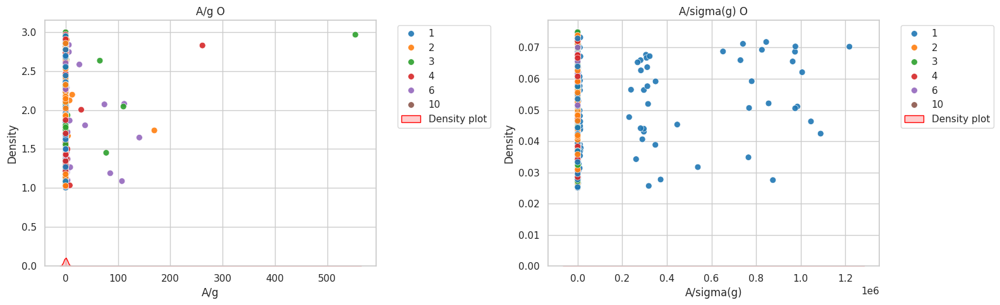

In [81]:
# Calculate new metric (absolute average of A divided by variance of g)


g_values = df_filtered['A/g_O']
gvar_values = df_filtered['A/sigma_g_O']
n_consumed_values = df_filtered['n_consumed']

# Expand other columns for plotting alignment
df_g = pd.DataFrame({
    'A/g': g_values,
    'n_consumed': n_consumed_values
})

df_varg = pd.DataFrame({
    'A/sigma(g)': gvar_values,
    'n_consumed': n_consumed_values
})

# Create the figure with 2x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

# Add jitter for y-axis alignment
jitter_strength_g = 1
jitter_strength_gvar = 0.0025
y_jitter_g = np.random.uniform(2 - jitter_strength_g, 2 + jitter_strength_g, size=len(df_g))
y_jitter_A = np.random.uniform(0.005 - jitter_strength_gvar, 0.005 + jitter_strength_gvar, size=len(df_varg))

# First plot: Individual g_abs by sparsity
sns.scatterplot(
    ax=axs[0], 
    x='A/g', 
    y=y_jitter_g, 
    hue='n_consumed', 
    data=df_g, 
    palette='tab10', 
    s=50, 
    alpha=0.9, 
    edgecolor="w", 
    linewidth=0.5
)
sns.kdeplot(ax=axs[0], x='A/g', data=df_g, color='red', label='Density plot', fill=True, alpha=0.2)
axs[0].set_title('A/g O')
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Third plot: Individual A_abs by sparsity
sns.scatterplot(
    ax=axs[1], 
    x='A/sigma(g)', 
    y=y_jitter_A * 10, 
    hue='n_consumed', 
    data=df_varg, 
    palette='tab10', 
    s=50, 
    alpha=0.9, 
    edgecolor="w", 
    linewidth=0.5
)
sns.kdeplot(ax=axs[1], x='A/sigma(g)', data=df_varg, color='red', label='Density plot', fill=True, alpha=0.2)
axs[1].set_title('A/sigma(g) O')
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [6]:
from scipy.stats import entropy

# Apply the function to compute Shannon diversity and add it as a new column
df_filtered['shannon_F'] = df_filtered['CR_N_F'].apply(lambda x: entropy(x[0][-1], base=np.e))
df_filtered['shannon_O'] = df_filtered['CR_N_O'].apply(lambda x: entropy(x[0][-1], base=np.e))

/tmp/ipykernel_1001729/1667933835.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


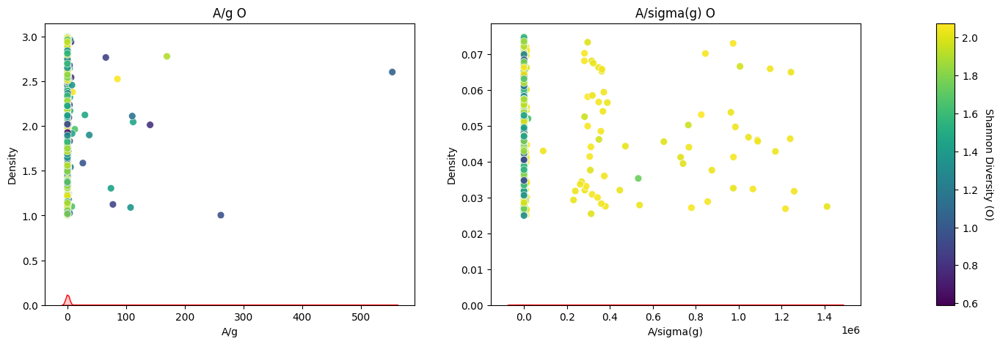

In [41]:
import matplotlib.gridspec as gridspec

from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Calculate new metric (absolute average of A divided by variance of g)
df_filtered['A/sigma_g_O'] = df_filtered['A_abs_avg_O'] / df_filtered['g0_O'].apply(np.std)
df_filtered['A/g_O'] = df_filtered['A_abs_avg_O'] / df_filtered['g_abs_avg_O']

g_values = df_filtered['A/g_O']
gvar_values = df_filtered['A/sigma_g_O']
shannon_values = df_filtered['shannon_O']

# Expand other columns for plotting alignment
df_g = pd.DataFrame({
    'A/g': g_values,
    'shannon_O': shannon_values
})

df_varg = pd.DataFrame({
    'A/sigma(g)': gvar_values,
    'shannon_O': shannon_values
})

# Create the figure with 1x2 subplots and extra space for colorbar
fig = plt.figure(figsize=(16, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.3)

# Add jitter for y-axis alignment
jitter_strength_g = 1
jitter_strength_gvar = 0.0025
y_jitter_g = np.random.uniform(2 - jitter_strength_g, 2 + jitter_strength_g, size=len(df_g))
y_jitter_A = np.random.uniform(0.005 - jitter_strength_gvar, 0.005 + jitter_strength_gvar, size=len(df_varg))

# Define a color normalization object
norm = Normalize(vmin=shannon_values.min(), vmax=shannon_values.max())
cmap = plt.get_cmap('viridis')

# First plot: Individual g_abs by sparsity
ax1 = plt.subplot(gs[0])
sns.scatterplot(
    ax=ax1, 
    x='A/g', 
    y=y_jitter_g, 
    hue='shannon_O', 
    data=df_g, 
    palette=cmap, 
    s=50, 
    alpha=0.9, 
    edgecolor="w", 
    linewidth=0.5
)
sns.kdeplot(ax=ax1, x='A/g', data=df_g, color='red', label='Density plot', fill=True, alpha=0.2)
ax1.set_title('A/g O')
ax1.legend([], [], frameon=False)  # Remove redundant legend

# Second plot: Individual A_abs by sparsity
ax2 = plt.subplot(gs[1])
sns.scatterplot(
    ax=ax2, 
    x='A/sigma(g)', 
    y=y_jitter_A * 10, 
    hue='shannon_O', 
    data=df_varg, 
    palette=cmap, 
    s=50, 
    alpha=0.9, 
    edgecolor="w", 
    linewidth=0.5
)
sns.kdeplot(ax=ax2, x='A/sigma(g)', data=df_varg, color='red', label='Density plot', fill=True, alpha=0.2)
ax2.set_title('A/sigma(g) O')
ax2.legend([], [], frameon=False)  # Remove redundant legend

# Add a continuous colorbar for the scatterplots
cbar_ax = plt.subplot(gs[2])  # Third column is for the colorbar
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Needed for ScalarMappable to work with colorbar
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Shannon Diversity (O)', rotation=270, labelpad=15)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Bunin metrics here

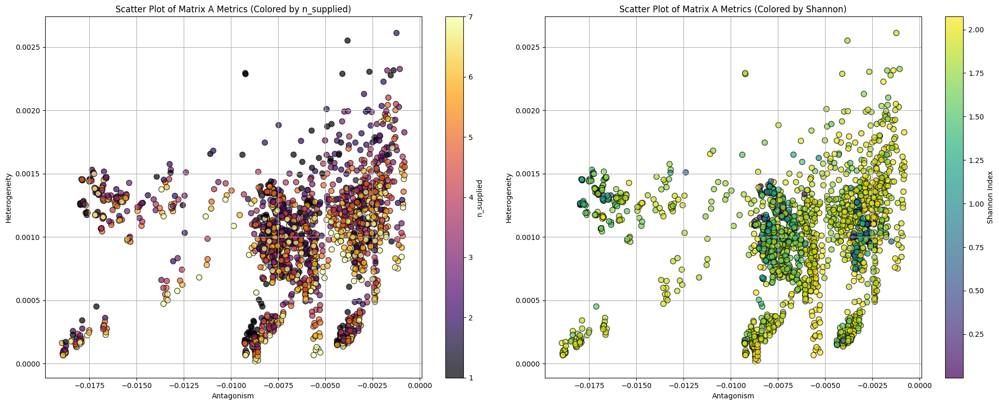

In [42]:

# Function to calculate off-diagonal mean
def calculate_off_diag_mean(matrix):
    matrix = np.array(matrix[0])  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return off_diag_values.mean()

# Function to calculate standard deviation
def calculate_std(matrix):
    matrix = np.array(matrix[0])  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return np.std(off_diag_values)

# Apply functions to calculate the off-diagonal mean and standard deviation
df_filtered['mean_off_diag_F'] = df_filtered['A_f'].apply(calculate_off_diag_mean)
df_filtered['std_A_F'] = df_filtered['A_f'].apply(calculate_std)

# Set up the figure with 1 row and 2 columns (side by side plots)
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Scatter plot, color by 'n_supplied'
scatter1 = axs[0].scatter(
    df_filtered['mean_off_diag_F'],
    df_filtered['std_A_F'],
    c=df_filtered['n_produced'],  # Color by 'n_supplied'
    cmap='inferno',
    s=60,
    alpha=0.7,
    edgecolor='k'
)
fig.colorbar(scatter1, ax=axs[0], label='n_supplied')
axs[0].set_xlabel('Antagonism')
axs[0].set_ylabel('Heterogeneity')
axs[0].set_title('Scatter Plot of Matrix A Metrics (Colored by n_supplied)')
axs[0].grid(True)

# Scatter plot, color by 'shannon'
scatter2 = axs[1].scatter(
    df_filtered['mean_off_diag_F'],
    df_filtered['std_A_F'],
    c=df_filtered['shannon_F'],  # Color by 'shannon'
    cmap='viridis',
    s=60,
    alpha=0.7,
    edgecolor='k'
)
fig.colorbar(scatter2, ax=axs[1], label='Shannon Index')
axs[1].set_xlabel('Antagonism')
axs[1].set_ylabel('Heterogeneity')
axs[1].set_title('Scatter Plot of Matrix A Metrics (Colored by Shannon)')
axs[1].grid(True)

# Show the plots
plt.tight_layout()
plt.show()

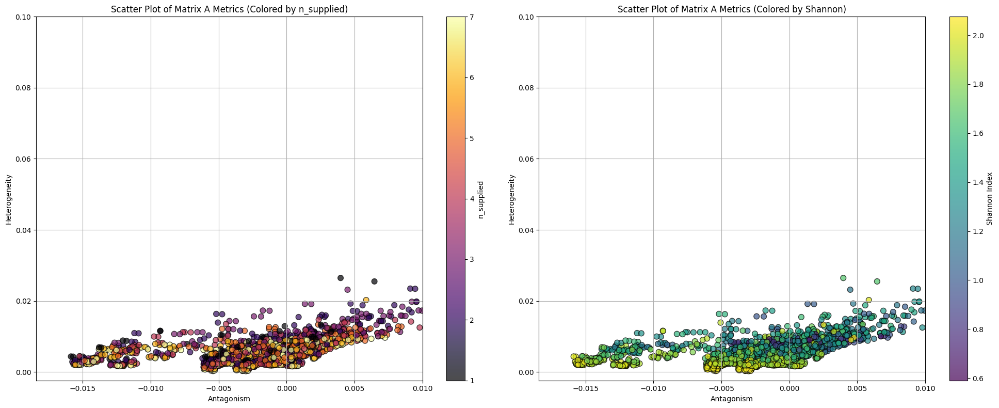

In [43]:

# Function to calculate off-diagonal mean
def calculate_off_diag_mean(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return off_diag_values.mean()

# Function to calculate standard deviation
def calculate_std(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return np.std(off_diag_values)

# Apply functions to calculate the off-diagonal mean and standard deviation
df_filtered['mean_off_diag_O'] = df_filtered['A_O'].apply(calculate_off_diag_mean)
df_filtered['std_A_O'] = df_filtered['A_O'].apply(calculate_std)

# Set up the figure with 1 row and 2 columns (side by side plots)
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Scatter plot, color by 'n_supplied'
scatter1 = axs[0].scatter(
    df_filtered['mean_off_diag_O'],
    df_filtered['std_A_O'],
    c=df_filtered['n_produced'],  # Color by 'n_supplied'
    cmap='inferno',
    s=60,
    alpha=0.7,
    edgecolor='k'
)
fig.colorbar(scatter1, ax=axs[0], label='n_supplied')
axs[0].set_xlabel('Antagonism')
axs[0].set_ylabel('Heterogeneity')
axs[0].set_xlim(None, 0.01)
axs[0].set_ylim(None, 0.1)
axs[0].set_title('Scatter Plot of Matrix A Metrics (Colored by n_supplied)')
axs[0].grid(True)

# Scatter plot, color by 'shannon'
scatter2 = axs[1].scatter(
    df_filtered['mean_off_diag_O'],
    df_filtered['std_A_O'],
    c=df_filtered['shannon_O'],  # Color by 'shannon'
    cmap='viridis',
    s=60,
    alpha=0.7,
    edgecolor='k'
)
fig.colorbar(scatter2, ax=axs[1], label='Shannon Index')
axs[1].set_xlabel('Antagonism')
axs[1].set_ylabel('Heterogeneity')
axs[1].set_xlim(None, 0.01)
axs[1].set_ylim(None, 0.1)
axs[1].set_title('Scatter Plot of Matrix A Metrics (Colored by Shannon)')
axs[1].grid(True)

# Show the plots
plt.tight_layout()
plt.show()

## Sensitivity analysis

In [9]:
df_filtered['n_consumed'] = pd.to_numeric(df_filtered['n_consumed'])

In [10]:
print(df_filtered.dtypes)

n_consumed            int64
n_produced           object
leakage             float64
PCS_bias            float64
PCS_var             float64
replica              object
C_F                  object
C_O                  object
D_F                  object
D_O                  object
CR_R_F               object
CR_R_O               object
CR_N_F               object
CR_N_O               object
LV_F                 object
LV_O                 object
g0_F                 object
A_f                  object
g0_O                 object
A_O                  object
richness_F            int64
richness_O            int64
collapse_F           object
collapse_O           object
connectivity_F      float64
connectivity_O      float64
pos_neg_counts_F     object
fraction_pos_F      float64
fraction_neg_F      float64
shannon_F           float64
shannon_O           float64
dtype: object


In [11]:
grouped = df_filtered.select_dtypes(include=[float, int]).groupby(df_filtered['n_consumed']).mean()
print(grouped.head())

            n_consumed   leakage  PCS_bias   PCS_var  richness_F  richness_O  \
n_consumed                                                                     
1                  1.0  0.450136  1.062500  0.063144    7.027174    7.222826   
2                  2.0  0.400000  1.079130  0.072640    7.132174    6.285217   
3                  3.0  0.406089  1.072600  0.080546    7.573770    5.580796   
4                  4.0  0.397569  1.043403  0.087125    7.204861    4.934028   
6                  6.0  0.405556  1.093750  0.084687    6.979167    4.708333   

            connectivity_F  connectivity_O  fraction_pos_F  fraction_neg_F  \
n_consumed                                                                   
1                      1.0             1.0        0.001043        0.998957   
2                      1.0             1.0        0.003385        0.996615   
3                      1.0             1.0        0.004015        0.995985   
4                      1.0             1.0       

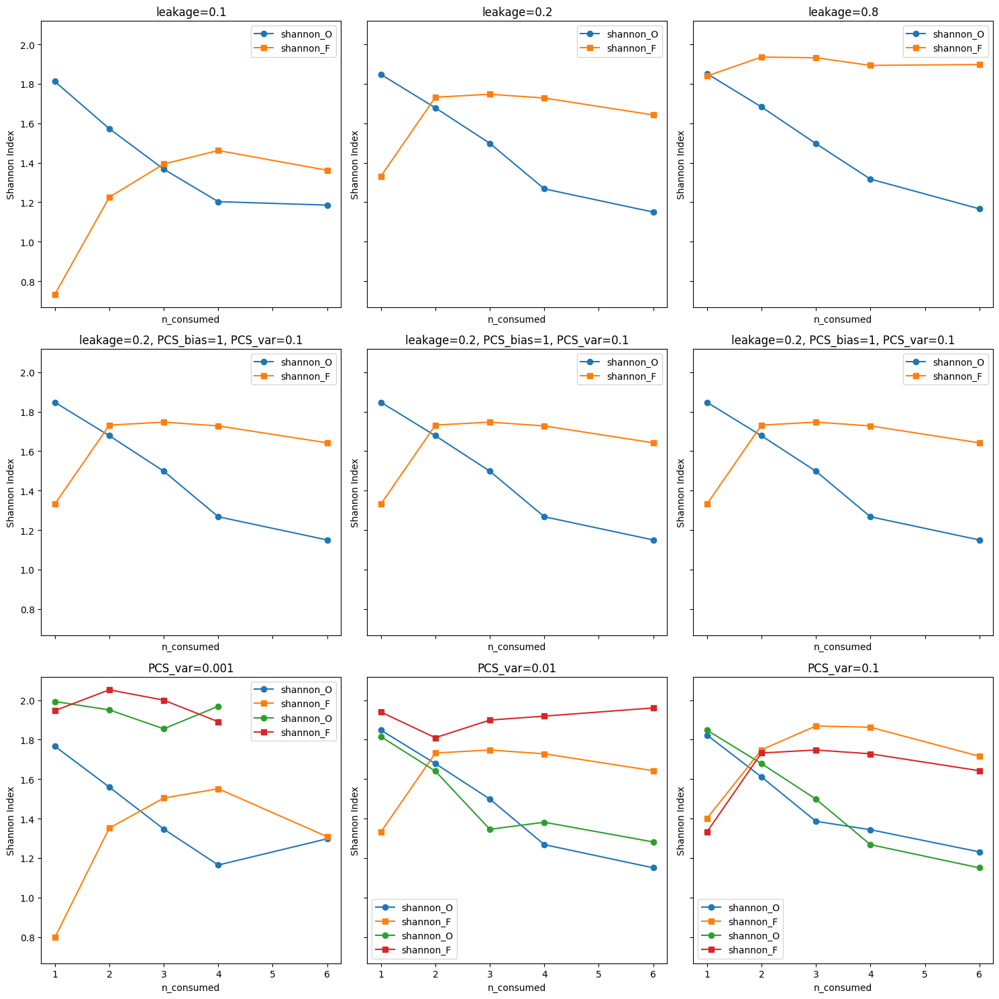

In [12]:
# Parameters
leakage_values = [0.1, 0.2, 0.8]
PCS_bias_values = [0.5, 1, 2]
PCS_var_values = [0.001, 0.01, 0.1]
chosen_params = {'leakage': 0.2, 'PCS_bias': 1, 'PCS_var': 0.1}

# Convert columns to numeric
for col in ['shannon_O', 'shannon_F', 'n_consumed']:
    df_filtered[col] = pd.to_numeric(df_filtered[col], errors='coerce')

# Drop rows with NaN values in the specified columns
df_filtered = df_filtered.dropna(subset=['shannon_O', 'shannon_F', 'n_consumed'])

# Helper function to filter and average data
def get_avg_shannon(df, leakage, PCS_bias, PCS_var):
    filtered = df[(df['leakage'] == leakage) &
                  (df['PCS_bias'] == PCS_bias) &
                  (df['PCS_var'] == PCS_var)]
    grouped = filtered.select_dtypes(include=[float, int]).groupby('n_consumed').mean()
    return grouped['shannon_O'], grouped['shannon_F']

# Create figure
fig, axes = plt.subplots(3, 3, figsize=(15, 15), sharex=True, sharey=True)
n_consumed = sorted(df_filtered['n_consumed'].unique())

# Plotting
for i, leakage in enumerate(leakage_values):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, leakage, chosen_params['PCS_bias'], chosen_params['PCS_var'])
    ax = axes[0, i]
    ax.plot(shannon_O.index, shannon_O, label='shannon_O', marker='o')
    ax.plot(shannon_F.index, shannon_F, label='shannon_F', marker='s')
    ax.set_title(f'leakage={leakage}')

for i in range(3):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, chosen_params['leakage'], chosen_params['PCS_bias'], chosen_params['PCS_var'])
    ax = axes[1, i]
    ax.plot(shannon_O.index, shannon_O, label='shannon_O', marker='o')
    ax.plot(shannon_F.index, shannon_F, label='shannon_F', marker='s')
    ax.set_title(f"leakage={chosen_params['leakage']}, PCS_bias={chosen_params['PCS_bias']}, PCS_var={chosen_params['PCS_var']}")

for i, PCS_bias in enumerate(PCS_bias_values):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, chosen_params['leakage'], PCS_bias, chosen_params['PCS_var'])
    ax = axes[2, 0] if i == 0 else (axes[2, 1] if i == 1 else axes[2, 2])
    ax.plot(shannon_O.index, shannon_O, label='shannon_O', marker='o')
    ax.plot(shannon_F.index, shannon_F, label='shannon_F', marker='s')
    ax.set_title(f'PCS_bias={PCS_bias}')

for i, PCS_var in enumerate(PCS_var_values):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, chosen_params['leakage'], chosen_params['PCS_bias'], PCS_var)
    ax = axes[2, i]
    ax.plot(shannon_O.index, shannon_O, label='shannon_O', marker='o')
    ax.plot(shannon_F.index, shannon_F, label='shannon_F', marker='s')
    ax.set_title(f'PCS_var={PCS_var}')

# Add labels and legends
for ax in axes.flatten():
    ax.set_xlabel('n_consumed')
    ax.set_ylabel('Shannon Index')
    ax.legend()

plt.tight_layout()
plt.show()

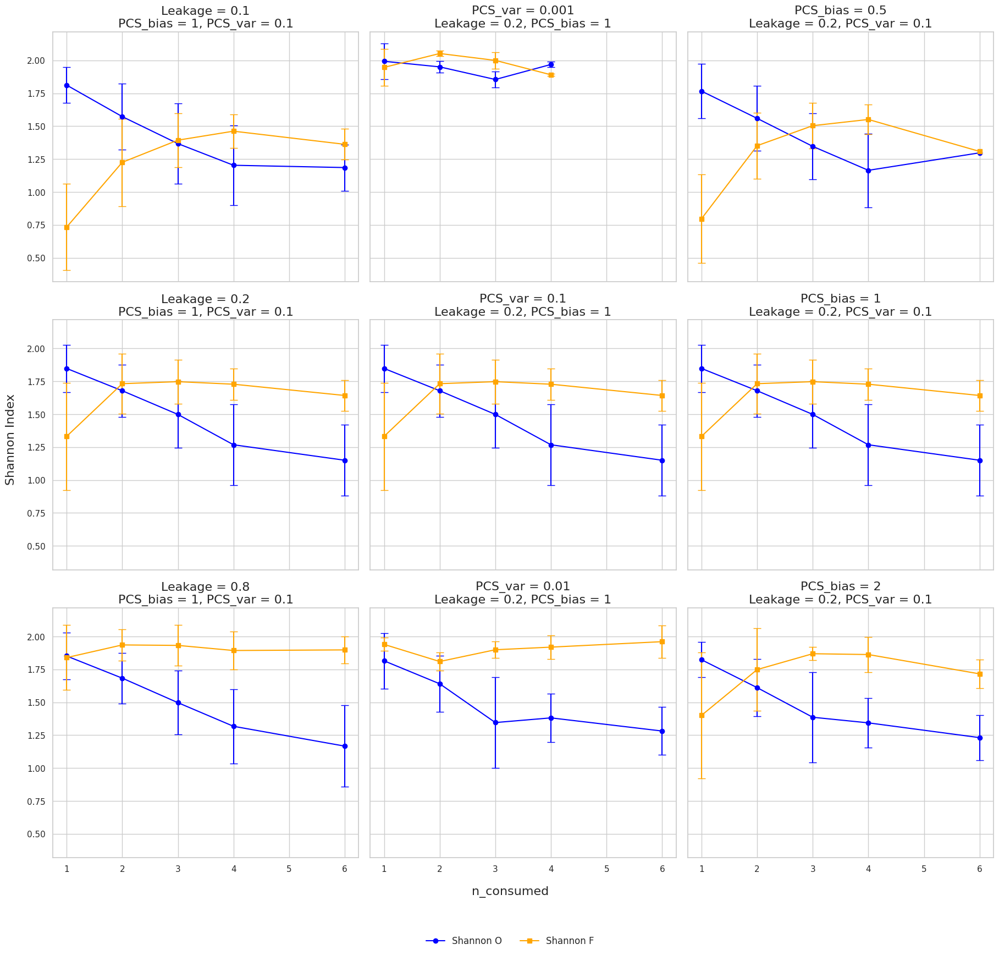

In [ ]:
# Helper function to filter, average data and calculate standard deviation
def get_avg_shannon(df, leakage, PCS_bias, PCS_var):
    filtered = df[(df['leakage'] == leakage) &
                  (df['PCS_bias'] == PCS_bias) &
                  (df['PCS_var'] == PCS_var)]
    grouped = filtered.select_dtypes(include=[float, int]).groupby('n_consumed').agg(['mean', 'std'])
    return grouped['shannon_O'], grouped['shannon_F']

# Assuming df_filtered is preprocessed and cleaned
# Set Seaborn style and parameters
sns.set_theme(style="whitegrid")
plt.rcParams.update({'font.size': 14, 'axes.titlesize': 16, 'axes.labelsize': 14, 'legend.fontsize': 12})

# Create figure
fig, axes = plt.subplots(3, 3, figsize=(18, 18), sharex=True, sharey=True)
n_consumed = sorted(df_filtered['n_consumed'].unique())

# Shared legend elements
line_styles = {'shannon_O': {'marker': 'o', 'color': 'blue', 'label': 'Shannon O'},
               'shannon_F': {'marker': 's', 'color': 'orange', 'label': 'Shannon F'}}

# Plotting

# First column: Varying leakage
for i, leakage in enumerate([0.1, chosen_params['leakage'], 0.8]):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, leakage, chosen_params['PCS_bias'], chosen_params['PCS_var'])
    ax = axes[i, 0]
    ax.errorbar(shannon_O.index, shannon_O['mean'], yerr=shannon_O['std'], **line_styles['shannon_O'], capsize=5)
    ax.errorbar(shannon_F.index, shannon_F['mean'], yerr=shannon_F['std'], **line_styles['shannon_F'], capsize=5)
    ax.set_title(f'Leakage = {leakage}\nPCS_bias = {chosen_params["PCS_bias"]}, PCS_var = {chosen_params["PCS_var"]}')

# Middle column: Varying PCS_var
for i, PCS_var in enumerate([0.001, chosen_params['PCS_var'], 0.01]):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, chosen_params['leakage'], chosen_params['PCS_bias'], PCS_var)
    ax = axes[i, 1]
    ax.errorbar(shannon_O.index, shannon_O['mean'], yerr=shannon_O['std'], **line_styles['shannon_O'], capsize=5)
    ax.errorbar(shannon_F.index, shannon_F['mean'], yerr=shannon_F['std'], **line_styles['shannon_F'], capsize=5)
    ax.set_title(f'PCS_var = {PCS_var}\nLeakage = {chosen_params["leakage"]}, PCS_bias = {chosen_params["PCS_bias"]}')

# Right column: Varying PCS_bias
for i, PCS_bias in enumerate([0.5, chosen_params['PCS_bias'], 2]):
    shannon_O, shannon_F = get_avg_shannon(df_filtered, chosen_params['leakage'], PCS_bias, chosen_params['PCS_var'])
    ax = axes[i, 2]
    ax.errorbar(shannon_O.index, shannon_O['mean'], yerr=shannon_O['std'], **line_styles['shannon_O'], capsize=5)
    ax.errorbar(shannon_F.index, shannon_F['mean'], yerr=shannon_F['std'], **line_styles['shannon_F'], capsize=5)
    ax.set_title(f'PCS_bias = {PCS_bias}\nLeakage = {chosen_params["leakage"]}, PCS_var = {chosen_params["PCS_var"]}')

# Add labels for the whole figure
fig.text(0.5, 0.04, 'n_consumed', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'Shannon Index', va='center', rotation='vertical', fontsize=16)

# Add a shared legend below the figure
handles = [plt.Line2D([], [], **line_styles['shannon_O']), plt.Line2D([], [], **line_styles['shannon_F'])]
fig.legend(handles=handles, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.02), frameon=False)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # Leave space for the legend and titles
plt.show()

In [14]:
# Helper function to filter, average data and calculate standard deviation
def get_avg_shannon(df, leakage, PCS_bias, PCS_var):
    filtered = df[(df['leakage'] == leakage) &
                  (df['PCS_bias'] == PCS_bias) &
                  (df['PCS_var'] == PCS_var)]
    grouped = filtered.select_dtypes(include=[float, int]).groupby('n_consumed').agg(['mean', 'std'])
    return grouped['shannon_O'], grouped['shannon_F']

## Diversity

/tmp/ipykernel_1001729/2681905996.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_0_2 = leakage_0_2.groupby(['n_consumed', 'n_produced'], group_keys=False) \
/tmp/ipykernel_1001729/2681905996.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_0_8 = leakage_0_8.groupby(['n_consumed', 'n_produced'], group_keys=False) \


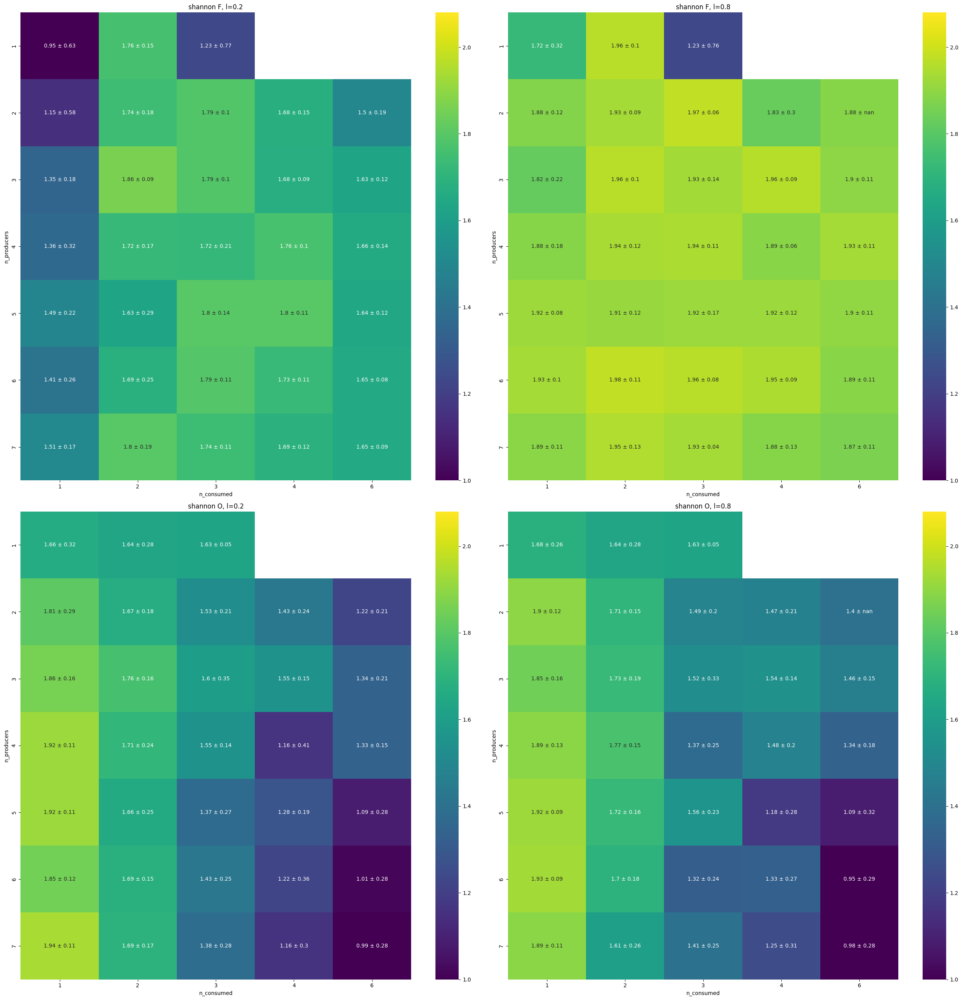

In [18]:
# Copy the DataFrame to avoid SettingWithCopyWarning
df_complete = df_filtered.copy()

df_complete = df_complete[(df_complete['n_consumed'] != 10) & (df_complete['PCS_bias']==1) & (df_complete['PCS_var']==0.1)]

# Separate the data by leakage
leakage_0_2 = df_complete[df_complete['leakage'] == 0.2]
leakage_0_8 = df_complete[df_complete['leakage'] == 0.8]

# Define the target size per group
target_size = 300  # Half of 500 networks
unique_combinations = leakage_0_2.groupby(['n_consumed', 'n_produced']).size()

# Calculate the sample size per group
sample_per_group_0_2 = target_size // len(unique_combinations)
sample_per_group_0_8 = target_size // len(unique_combinations)

# Sample data for leakage = 0.2
sampled_0_2 = leakage_0_2.groupby(['n_consumed', 'n_produced'], group_keys=False) \
    .apply(lambda x: x.sample(min(len(x), sample_per_group_0_2), random_state=42))

# Sample data for leakage = 0.8
sampled_0_8 = leakage_0_8.groupby(['n_consumed', 'n_produced'], group_keys=False) \
    .apply(lambda x: x.sample(min(len(x), sample_per_group_0_8), random_state=42))

# Calculate diversity using agg() (mean Shannon entropy) and standard deviation for both 'shannon_F' and 'shannon_O'
diversity_0_2_mean_F = sampled_0_2.groupby(['n_consumed', 'n_produced'])['shannon_F'].agg('mean').unstack(fill_value=np.nan)
diversity_0_2_std_F = sampled_0_2.groupby(['n_consumed', 'n_produced'])['shannon_F'].agg('std').unstack(fill_value=np.nan)
diversity_0_8_mean_F = sampled_0_8.groupby(['n_consumed', 'n_produced'])['shannon_F'].agg('mean').unstack(fill_value=np.nan)
diversity_0_8_std_F = sampled_0_8.groupby(['n_consumed', 'n_produced'])['shannon_F'].agg('std').unstack(fill_value=np.nan)

# Repeat the process for 'shannon_O'
diversity_0_2_mean_O = sampled_0_2.groupby(['n_consumed', 'n_produced'])['shannon_O'].agg('mean').unstack(fill_value=np.nan)
diversity_0_2_std_O = sampled_0_2.groupby(['n_consumed', 'n_produced'])['shannon_O'].agg('std').unstack(fill_value=np.nan)
diversity_0_8_mean_O = sampled_0_8.groupby(['n_consumed', 'n_produced'])['shannon_O'].agg('mean').unstack(fill_value=np.nan)
diversity_0_8_std_O = sampled_0_8.groupby(['n_consumed', 'n_produced'])['shannon_O'].agg('std').unstack(fill_value=np.nan)

# Find global vmin and vmax for both heatmaps (shannon_F and shannon_O)
vmin_F = 1
vmax_F = 2.08

# Create annotations with mean ± std for both shannon_F and shannon_O
annotations_0_2_F = diversity_0_2_mean_F.round(2).astype(str) + ' ± ' + diversity_0_2_std_F.round(2).astype(str)
annotations_0_8_F = diversity_0_8_mean_F.round(2).astype(str) + ' ± ' + diversity_0_8_std_F.round(2).astype(str)

annotations_0_2_O = diversity_0_2_mean_O.round(2).astype(str) + ' ± ' + diversity_0_2_std_O.round(2).astype(str)
annotations_0_8_O = diversity_0_8_mean_O.round(2).astype(str) + ' ± ' + diversity_0_8_std_O.round(2).astype(str)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(26, 26))

# Plot heatmap for shannon_F (leakage = 0.2)
sns.heatmap(diversity_0_2_mean_F.T, ax=axes[0, 0], annot=annotations_0_2_F.T, fmt='', cmap='viridis', cbar=True,
            mask=diversity_0_2_mean_F.T.isna(), vmin=vmin_F, vmax=vmax_F)
axes[0, 0].set_title('shannon F, l=0.2')
axes[0, 0].set_xlabel('n_consumed')
axes[0, 0].set_ylabel('n_producers')

# Plot heatmap for shannon_F (leakage = 0.8)
sns.heatmap(diversity_0_8_mean_F.T, ax=axes[0, 1], annot=annotations_0_8_F.T, fmt='', cmap='viridis', cbar=True,
            mask=diversity_0_8_mean_F.T.isna(), vmin=vmin_F, vmax=vmax_F)
axes[0, 1].set_title('shannon F, l=0.8')
axes[0, 1].set_xlabel('n_consumed')
axes[0, 1].set_ylabel('n_producers')

# Plot heatmap for shannon_O (leakage = 0.2)
sns.heatmap(diversity_0_2_mean_O.T, ax=axes[1, 0], annot=annotations_0_2_O.T, fmt='', cmap='viridis', cbar=True,
            mask=diversity_0_2_mean_O.T.isna(), vmin=vmin_F, vmax=vmax_F)
axes[1, 0].set_title('shannon O, l=0.2')
axes[1, 0].set_xlabel('n_consumed')
axes[1, 0].set_ylabel('n_producers')

# Plot heatmap for shannon_O (leakage = 0.8)
sns.heatmap(diversity_0_8_mean_O.T, ax=axes[1, 1], annot=annotations_0_8_O.T, fmt='', cmap='viridis', cbar=True,
            mask=diversity_0_8_mean_O.T.isna(), vmin=vmin_F, vmax=vmax_F)
axes[1, 1].set_title('shannon O, l=0.8')
axes[1, 1].set_xlabel('n_consumed')
axes[1, 1].set_ylabel('n_producers')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

In [83]:
np.mean(df_complete['CR_R_O'][1][-1][-1][np.delete(np.where(np.sum(df_complete['C_F'][1][0],axis=0)>0),0)])

np.float64(0.06254758470025158)

In [84]:
# Define the custom function to apply to each row
def compute_mean(row):
    cr_r_o = row['CR_R_O'][-1][-1]
    c_f = row['C_F'][0]
    indices_to_delete = np.delete(np.where(np.sum(c_f, axis=0) > 0), 0)
    return np.mean(cr_r_o[indices_to_delete])

# Apply the custom function to each row and create a new column for the results
df_complete['avg_conc'] = df_complete.apply(compute_mean, axis=1)

/tmp/ipykernel_1001729/2331575878.py:9: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = filtered_df.pivot_table(index='n_produced', columns='n_consumed', values='avg_conc')


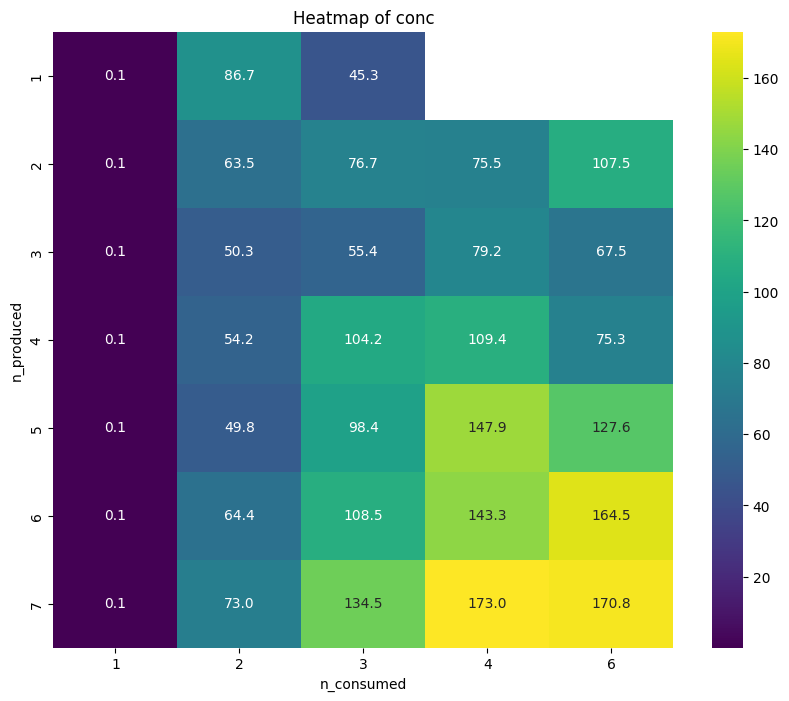

In [86]:
Q1 = df_complete['avg_conc'].quantile(0.25)
Q3 = df_complete['avg_conc'].quantile(0.75)
IQR = Q3 - Q1

# Step 2: Filter out the rows where 'avg_conc' is an outlier
filtered_df = df_complete[(df_complete['avg_conc'] >= (Q1 - 1.5 * IQR)) & (df_complete['avg_conc'] <= (Q3 + 1.5 * IQR))]

# Step 3: Create the pivot table with the filtered data
heatmap_data = filtered_df.pivot_table(index='n_produced', columns='n_consumed', values='avg_conc')

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, cmap="viridis", annot=True, fmt=".1f")
plt.title('Heatmap of conc')
plt.xlabel('n_consumed')
plt.ylabel('n_produced')

# Show the plot
plt.show()

# ANOVA

In [19]:
# Combine the sampled data with leakage information
sampled_0_2['leakage'] = 0.2
sampled_0_8['leakage'] = 0.8
sampled_data = pd.concat([sampled_0_2, sampled_0_8])

In [21]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Define the formula for the three-way ANOVA
formula_F = 'shannon_F ~ C(n_consumed) + C(n_produced) + C(leakage) + C(n_consumed):C(n_produced) + C(n_consumed):C(leakage) + C(n_produced):C(leakage) + C(n_consumed):C(n_produced):C(leakage)'

# Fit the model
model_F = ols(formula_F, data=sampled_data).fit()

# Perform the ANOVA
anova_results_F = sm.stats.anova_lm(model_F, typ=2)
print("ANOVA results for shannon_F:")
print(anova_results_F)

ANOVA results for shannon_F:
                                           sum_sq     df           F  \
C(n_consumed)                            2.198759    4.0   14.749744   
C(n_produced)                            3.163251    6.0   14.146508   
C(leakage)                              10.631341    1.0  285.269219   
C(n_consumed):C(n_produced)              3.908789   24.0    4.370165   
C(n_consumed):C(leakage)                 0.868290    4.0    5.824673   
C(n_produced):C(leakage)                 0.572099    6.0    2.558506   
C(n_consumed):C(n_produced):C(leakage)   2.532984   24.0    2.831966   
Residual                                17.963054  482.0         NaN   

                                              PR(>F)  
C(n_consumed)                           2.238083e-11  
C(n_produced)                           7.286730e-15  
C(leakage)                              1.304538e-50  
C(n_consumed):C(n_produced)             9.641912e-11  
C(n_consumed):C(leakage)                1.38819

In [22]:
# Define the formula for the three-way ANOVA
formula_O = 'shannon_O ~ C(n_consumed) + C(n_produced) + C(leakage) + C(n_consumed):C(n_produced) + C(n_consumed):C(leakage) + C(n_produced):C(leakage) + C(n_consumed):C(n_produced):C(leakage)'

# Fit the model
model_O = ols(formula_O, data=sampled_data).fit()

# Perform the ANOVA
anova_results_O = sm.stats.anova_lm(model_O, typ=2)
print("ANOVA results for shannon_O:")
print(anova_results_O)

ANOVA results for shannon_O:
                                           sum_sq     df          F  \
C(n_consumed)                            3.909821    4.0  18.908039   
C(n_produced)                            3.078790    6.0   9.926096   
C(leakage)                               0.035244    1.0   0.681761   
C(n_consumed):C(n_produced)             31.232531   24.0  25.173615   
C(n_consumed):C(leakage)                 0.095054    4.0   0.459684   
C(n_produced):C(leakage)                 0.043645    6.0   0.140712   
C(n_consumed):C(n_produced):C(leakage)   1.039464   24.0   0.837814   
Residual                                24.917094  482.0        NaN   

                                              PR(>F)  
C(n_consumed)                           1.870583e-14  
C(n_produced)                           2.433094e-10  
C(leakage)                              4.093896e-01  
C(n_consumed):C(n_produced)             7.856764e-70  
C(n_consumed):C(leakage)                7.653326e-01  
C

/tmp/ipykernel_966874/2837880346.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=4, w_pad=0)


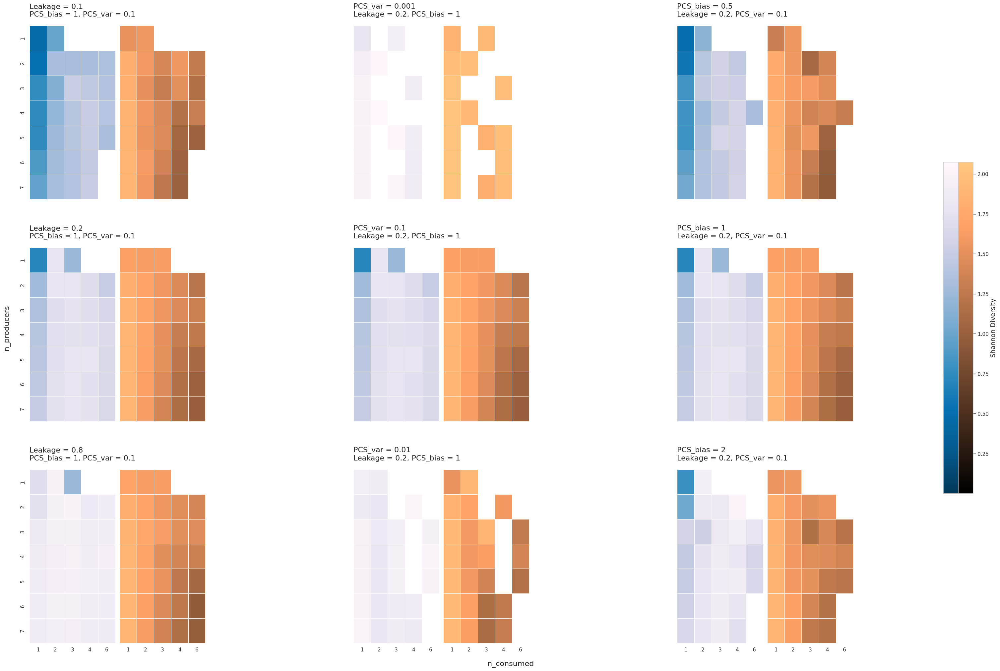

In [53]:
# Create figure with adjusted size and spacing
fig, axes = plt.subplots(3, 3, figsize=(30, 20), sharex=True, sharey=True)  # Adjusted figure size

def get_heatmap_data(df, leakage, PCS_bias, PCS_var):
    # Define the desired n_consumed values
    desired_n_consumed = [1, 2, 3, 4, 6]
    
    # Filter the dataframe based on the given leakage, PCS_bias, and PCS_var
    subset = df[(df['leakage'] == leakage) & (df['PCS_bias'] == PCS_bias) & (df['PCS_var'] == PCS_var)]
    
    # Create the pivot tables
    pivot_O = subset.pivot_table(index='n_consumed', columns='n_produced', values='shannon_O', aggfunc='mean').T.iloc[::-1]
    pivot_F = subset.pivot_table(index='n_consumed', columns='n_produced', values='shannon_F', aggfunc='mean').T.iloc[::-1]
    
    # Reindex the pivot tables to ensure the desired n_consumed values are present
    pivot_O = pivot_O.reindex(columns=desired_n_consumed)
    pivot_F = pivot_F.reindex(columns=desired_n_consumed)
    
    return pivot_O, pivot_F

# Heatmap parameters
heatmap_params_O = {
    'cmap': 'copper',
    'cbar': False,  # We will create a single colorbar later
    'linewidths': 0.5,
    'linecolor': 'white'
}
heatmap_params_F = {
    'cmap': 'PuBu_r',
    'cbar': False,  # We will create a single colorbar later
    'linewidths': 0.5,
    'linecolor': 'white'
}

# Define the unified color scale for both heatmaps
vmin = min(df_filtered['shannon_O'].min(), df_filtered['shannon_F'].min())
vmax = max(df_filtered['shannon_O'].max(), df_filtered['shannon_F'].max())


# First column: Varying leakage
for i, leakage in enumerate([0.1, chosen_params['leakage'], 0.8]):
    pivot_O, pivot_F = get_heatmap_data(df_filtered, leakage, chosen_params['PCS_bias'], chosen_params['PCS_var'])
    sns.heatmap(pivot_F, ax=axes[i, 0], **heatmap_params_F, annot=False, vmin=vmin, vmax=vmax,xticklabels=True, yticklabels=True)
    inset_ax = axes[i, 0].inset_axes([1.05, 0, 1, 1])
    if i == 2:
        sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax,xticklabels=True, yticklabels=False)
    else:
        sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax,xticklabels=False, yticklabels=False)    
    inset_ax.invert_yaxis()
    axes[i,0].set_xlabel('')
    inset_ax.set_ylabel('')
    axes[i,0].set_ylabel('')
    inset_ax.set_xlabel('')
    inset_ax.grid(False)
    axes[i,0].set_title(f'Leakage = {leakage}\nPCS_bias = {chosen_params["PCS_bias"]}, PCS_var = {chosen_params["PCS_var"]}', loc='left', pad=20)

# Middle column: Varying PCS_var
for i, PCS_var in enumerate([0.001, chosen_params['PCS_var'], 0.01]):
    pivot_O, pivot_F = get_heatmap_data(df_filtered, chosen_params['leakage'], chosen_params['PCS_bias'], PCS_var)
    sns.heatmap(pivot_F, ax=axes[i, 1], **heatmap_params_F, annot=False, vmin=vmin, vmax=vmax,xticklabels=True, yticklabels=True)
    inset_ax = axes[i, 1].inset_axes([1.05, 0, 1, 1])
    if i == 2:
        sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax,xticklabels=True, yticklabels=False)
    else:
        sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax,xticklabels=False, yticklabels=False)    
    inset_ax.invert_yaxis()
    axes[i,1].set_xlabel('')
    inset_ax.set_ylabel('')
    axes[i,1].set_ylabel('')
    inset_ax.set_xlabel('')
    inset_ax.grid(False)
    axes[i,1].set_title(f'PCS_var = {PCS_var}\nLeakage = {chosen_params["leakage"]}, PCS_bias = {chosen_params["PCS_bias"]}', loc='left', pad=20)

# Right column: Varying PCS_bias
for i, PCS_bias in enumerate([0.5, chosen_params['PCS_bias'], 2]):
    pivot_O, pivot_F = get_heatmap_data(df_filtered, chosen_params['leakage'], PCS_bias, chosen_params['PCS_var'])
    sns.heatmap(pivot_F, ax=axes[i, 2], **heatmap_params_F, annot=False, vmin=vmin, vmax=vmax,xticklabels=True, yticklabels=True)
    inset_ax = axes[i, 2].inset_axes([1.05, 0, 1, 1])
    if i == 2:
        sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax,xticklabels=True, yticklabels=False)
    else:
        sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax,xticklabels=False, yticklabels=False)
    axes[i, 2].invert_yaxis()
    inset_ax.invert_yaxis()
    axes[i,2].set_xlabel('')
    inset_ax.set_ylabel('')
    axes[i,2].set_ylabel('')
    inset_ax.set_xlabel('')
    inset_ax.grid(False)
    axes[i, 2].set_title(f'PCS_bias = {PCS_bias}\nLeakage = {chosen_params["leakage"]}, PCS_var = {chosen_params["PCS_var"]}', loc='left', pad=20)

# Adjust labels and spacing for the whole figure
fig.text(0.5, -0.01, 'n_consumed', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'n_producers', va='center', rotation='vertical', fontsize=16)

cbar_ax_F = fig.add_axes([0.935, 0.25, 0.015, 0.5])  # Position for the Blues colorbar
cbar_F = fig.colorbar(plt.cm.ScalarMappable(cmap='PuBu_r', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax_F,ticks=[])

# Add two synchronized colorbars for the unified scale
cbar_ax_O = fig.add_axes([0.95, 0.25, 0.015, 0.5])  # Position for the YlOrBr colorbar
cbar_O = fig.colorbar(plt.cm.ScalarMappable(cmap='copper', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax_O)
cbar_O.set_label('Shannon Diversity', fontsize=14)

for ax in axes.flatten():
    ax.grid(False)


# Adjust layout
plt.grid(False)
plt.tight_layout(h_pad=4, w_pad=0)
plt.show()


/tmp/ipykernel_966874/2375362946.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(h_pad=4, w_pad=0)


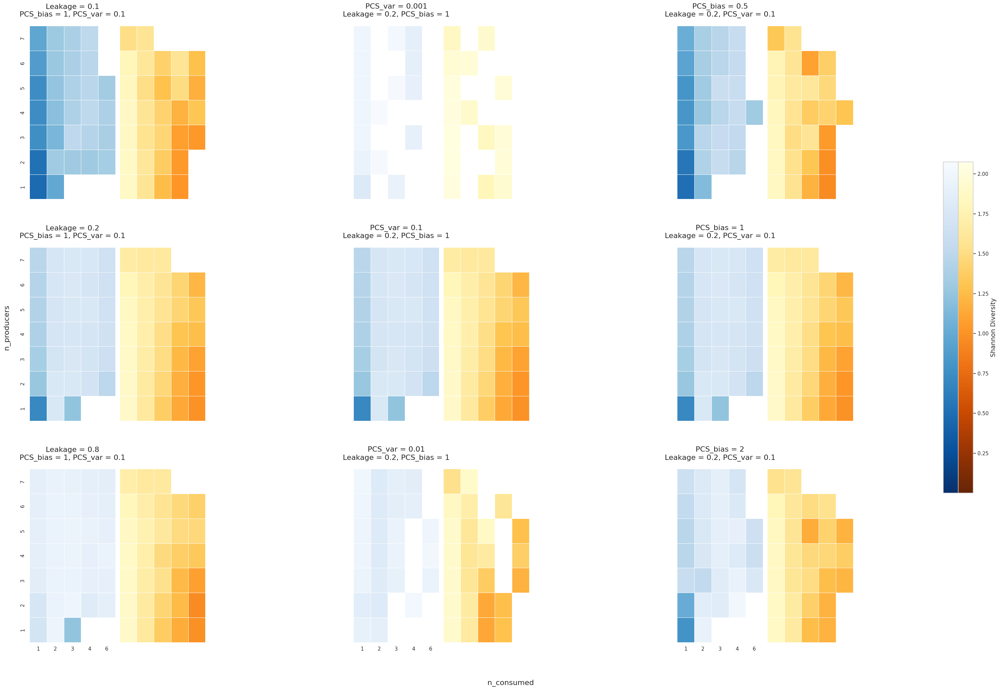

In [48]:
# Create figure with adjusted size and spacing
fig, axes = plt.subplots(3, 3, figsize=(30, 20), sharex=True, sharey=True)  # Adjusted figure size

def get_heatmap_data(df, leakage, PCS_bias, PCS_var):
    # Define the desired n_consumed values
    desired_n_consumed = [1, 2, 3, 4, 6]
    
    # Filter the dataframe based on the given leakage, PCS_bias, and PCS_var
    subset = df[(df['leakage'] == leakage) & (df['PCS_bias'] == PCS_bias) & (df['PCS_var'] == PCS_var)]
    
    # Create the pivot tables
    pivot_O = subset.pivot_table(index='n_consumed', columns='n_produced', values='shannon_O', aggfunc='mean').T.iloc[::-1]
    pivot_F = subset.pivot_table(index='n_consumed', columns='n_produced', values='shannon_F', aggfunc='mean').T.iloc[::-1]
    
    # Reindex the pivot tables to ensure the desired n_consumed values are present
    pivot_O = pivot_O.reindex(columns=desired_n_consumed)
    pivot_F = pivot_F.reindex(columns=desired_n_consumed)
    
    return pivot_O, pivot_F

# Heatmap parameters
heatmap_params_O = {
    'cmap': 'YlOrBr_r',
    'cbar': False,  # We will create a single colorbar later
    'linewidths': 0.5,
    'linecolor': 'white'
}
heatmap_params_F = {
    'cmap': 'Blues_r',
    'cbar': False,  # We will create a single colorbar later
    'linewidths': 0.5,
    'linecolor': 'white'
}

# Define the unified color scale for both heatmaps
vmin = min(df_filtered['shannon_O'].min(), df_filtered['shannon_F'].min())
vmax = max(df_filtered['shannon_O'].max(), df_filtered['shannon_F'].max())

# First column: Varying leakage
for i, leakage in enumerate([0.1, chosen_params['leakage'], 0.8]):
    pivot_O, pivot_F = get_heatmap_data(df_filtered, leakage, chosen_params['PCS_bias'], chosen_params['PCS_var'])
    sns.heatmap(pivot_F, ax=axes[i, 0], **heatmap_params_F, annot=False, vmin=vmin, vmax=vmax, xticklabels=True, yticklabels=True)
    inset_ax = axes[i, 0].inset_axes([1.05, 0, 1, 1])
    sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax, xticklabels=False, yticklabels=False)    
    inset_ax.invert_yaxis()
    axes[i, 0].set_xlabel('')
    inset_ax.set_ylabel('')
    axes[i, 0].set_ylabel('')
    inset_ax.set_xlabel('')
    inset_ax.grid(False)
    axes[i, 0].set_title(f'Leakage = {leakage}\nPCS_bias = {chosen_params["PCS_bias"]}, PCS_var = {chosen_params["PCS_var"]}', loc='center', pad=20)

# Middle column: Varying PCS_var
for i, PCS_var in enumerate([0.001, chosen_params['PCS_var'], 0.01]):
    pivot_O, pivot_F = get_heatmap_data(df_filtered, chosen_params['leakage'], chosen_params['PCS_bias'], PCS_var)
    sns.heatmap(pivot_F, ax=axes[i, 1], **heatmap_params_F, annot=False, vmin=vmin, vmax=vmax, xticklabels=True, yticklabels=True)
    inset_ax = axes[i, 1].inset_axes([1.05, 0, 1, 1])
    sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax, xticklabels=False, yticklabels=False)    
    inset_ax.invert_yaxis()
    axes[i, 1].set_xlabel('')
    inset_ax.set_ylabel('')
    axes[i, 1].set_ylabel('')
    inset_ax.set_xlabel('')
    inset_ax.grid(False)
    axes[i, 1].set_title(f'PCS_var = {PCS_var}\nLeakage = {chosen_params["leakage"]}, PCS_bias = {chosen_params["PCS_bias"]}', loc='center', pad=20)

# Right column: Varying PCS_bias
for i, PCS_bias in enumerate([0.5, chosen_params['PCS_bias'], 2]):
    pivot_O, pivot_F = get_heatmap_data(df_filtered, chosen_params['leakage'], PCS_bias, chosen_params['PCS_var'])
    sns.heatmap(pivot_F, ax=axes[i, 2], **heatmap_params_F, annot=False, vmin=vmin, vmax=vmax, xticklabels=True, yticklabels=True)
    inset_ax = axes[i, 2].inset_axes([1.05, 0, 1, 1])
    sns.heatmap(pivot_O, ax=inset_ax, **heatmap_params_O, annot=False, vmin=vmin, vmax=vmax, xticklabels=False, yticklabels=False)
    inset_ax.invert_yaxis()
    axes[i, 2].set_xlabel('')
    inset_ax.set_ylabel('')
    axes[i, 2].set_ylabel('')
    inset_ax.set_xlabel('')
    inset_ax.grid(False)
    axes[i, 2].set_title(f'PCS_bias = {PCS_bias}\nLeakage = {chosen_params["leakage"]}, PCS_var = {chosen_params["PCS_var"]}', loc='center', pad=20)

# Adjust labels and spacing for the whole figure
fig.text(0.5, -0.04, 'n_consumed', ha='center', fontsize=16)
fig.text(-0.01, 0.5, 'n_producers', va='center', rotation='vertical', fontsize=16)

cbar_ax_F = fig.add_axes([0.935, 0.25, 0.015, 0.5])  # Position for the Blues colorbar
cbar_F = fig.colorbar(plt.cm.ScalarMappable(cmap='Blues_r', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax_F, ticks=[])

# Add two synchronized colorbars for the unified scale
cbar_ax_O = fig.add_axes([0.95, 0.25, 0.015, 0.5])  # Position for the YlOrBr colorbar
cbar_O = fig.colorbar(plt.cm.ScalarMappable(cmap='YlOrBr_r', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax_O)
cbar_O.set_label('Shannon Diversity', fontsize=14)

for ax in axes.flatten():
    ax.grid(False)

# Adjust layout
plt.grid(False)
plt.tight_layout(h_pad=4, w_pad=0)
plt.show()

# Actual comparisons

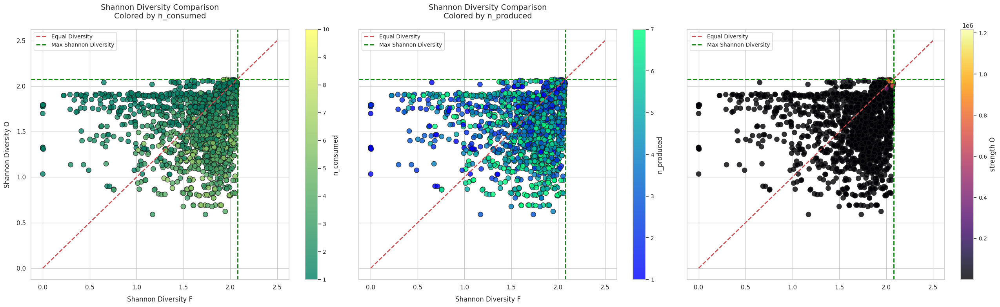

In [86]:
# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(26, 8), sharex=True, sharey=True)

# Scatter plot for n_consumed
sc1 = axes[0].scatter(
    df_filtered['shannon_F'],      
    df_filtered['shannon_O'],    
    c=df_filtered['n_consumed'],  
    cmap='summer',                
    s=80,                         
    edgecolor='k',                
    alpha=0.8                     
)

# Add a color bar for n_consumed
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('n_consumed', fontsize=12)
cbar1.ax.tick_params(labelsize=10)

# Scatter plot for n_produced
sc2 = axes[1].scatter(
    df_filtered['shannon_F'],      
    df_filtered['shannon_O'],    
    c=df_filtered['n_produced'],  
    cmap='winter',                
    s=80,                         
    edgecolor='k',                
    alpha=0.8                     
)

# Add a color bar for n_produced
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('n_produced', fontsize=12)
cbar2.ax.tick_params(labelsize=10)

# Scatter plot for n_produced
sc3 = axes[2].scatter(
    df_filtered['shannon_F'],      
    df_filtered['shannon_O'],    
    c=df_filtered['A/sigma_g_O'],  
    cmap='inferno',                
    s=80,                         
    edgecolor='k',                
    alpha=0.8                     
)

# Add a color bar for n_produced
cbar3 = fig.colorbar(sc3, ax=axes[2])
cbar3.set_label('strength O', fontsize=12)
cbar3.ax.tick_params(labelsize=10)

# Add a diagonal line and max diversity lines to both subplots
for ax in axes:
    ax.plot([0., 2.5], [0., 2.5], 'r--', linewidth=2, label='Equal Diversity')
    ax.axhline(y=np.log(8), color='green', linestyle='--', linewidth=2, label='Max Shannon Diversity')
    ax.axvline(x=np.log(8), color='green', linestyle='--', linewidth=2)
    ax.legend(fontsize=10)

# Add labels, titles, and gridlines for each subplot
axes[0].set_title('Shannon Diversity Comparison\nColored by n_consumed', fontsize=14, pad=20)
axes[0].set_xlabel('Shannon Diversity F', fontsize=12, labelpad=10)
axes[0].set_ylabel('Shannon Diversity O', fontsize=12, labelpad=10)

axes[1].set_title('Shannon Diversity Comparison\nColored by n_produced', fontsize=14, pad=20)
axes[1].set_xlabel('Shannon Diversity F', fontsize=12, labelpad=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_2235615/3580844901.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = df_filtered.groupby('n_consumed').agg(


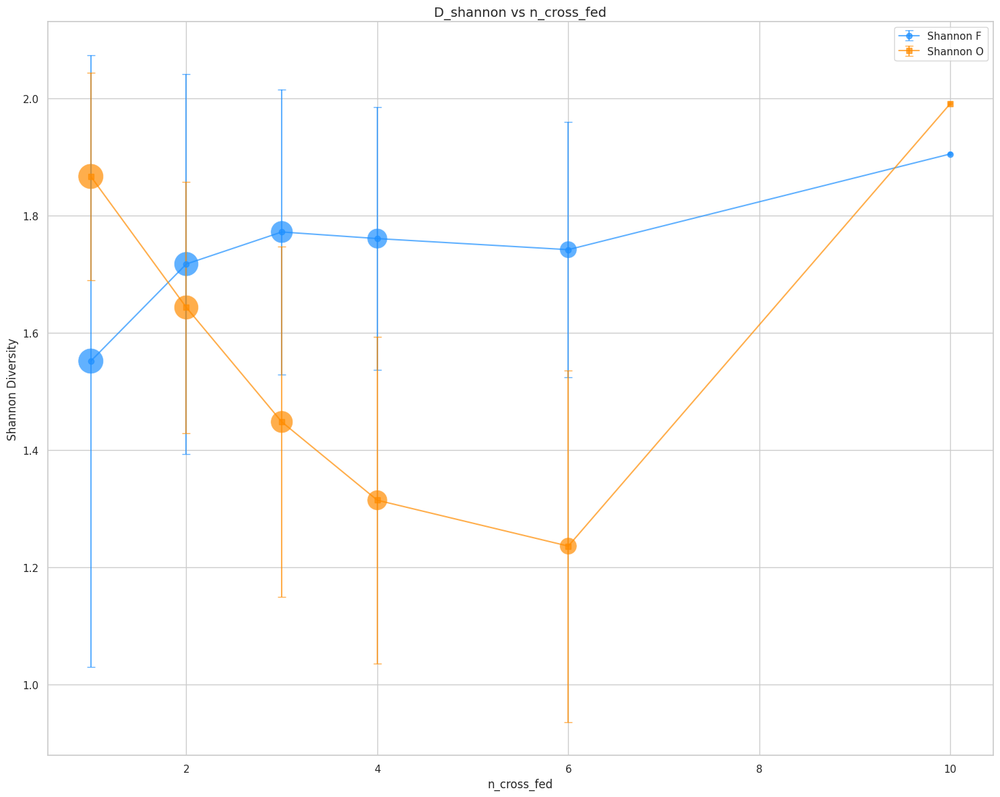

In [87]:
# Group the dataframe by 'n_consumed' and calculate the mean, std, and count for Shannon diversity
grouped_data = df_filtered.groupby('n_consumed').agg(
    shannon_sp_avg=('shannon_F', 'mean'),
    shannon_sp_std=('shannon_F', 'std'),
    shannon_avg=('shannon_O', 'mean'),
    shannon_std=('shannon_O', 'std'),
    count=('shannon_F', 'size')  # Count the number of elements in each bin
).reset_index()

# Calculate marker sizes based on count
marker_sizes = np.sqrt(grouped_data['count']) * 30  # Adjust multiplier for appropriate scaling

# Set up the figure
plt.figure(figsize=(15, 12))

# Plot Shannon F with error bars, lines, and variable-sized points
plt.errorbar(
    grouped_data['n_consumed'], 
    grouped_data['shannon_sp_avg'], 
    yerr=grouped_data['shannon_sp_std'], 
    fmt='-o', color='DodgerBlue', label='Shannon F', alpha=0.7, capsize=4
)
plt.scatter(
    grouped_data['n_consumed'], 
    grouped_data['shannon_sp_avg'], 
    s=marker_sizes, color='DodgerBlue', alpha=0.7, edgecolor='w', linewidth=0.5
)

# Plot Shannon O with error bars, lines, and variable-sized points
plt.errorbar(
    grouped_data['n_consumed'], 
    grouped_data['shannon_avg'], 
    yerr=grouped_data['shannon_std'], 
    fmt='-s', color='DarkOrange', label='Shannon O', alpha=0.7, capsize=4
)
plt.scatter(
    grouped_data['n_consumed'], 
    grouped_data['shannon_avg'], 
    s=marker_sizes, color='DarkOrange', alpha=0.7, edgecolor='w', linewidth=0.5
)

# Add labels, title, and legend
plt.xlabel('n_cross_fed', fontsize=12)
plt.ylabel('Shannon Diversity', fontsize=12)
plt.title('D_shannon vs n_cross_fed', fontsize=14)
plt.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

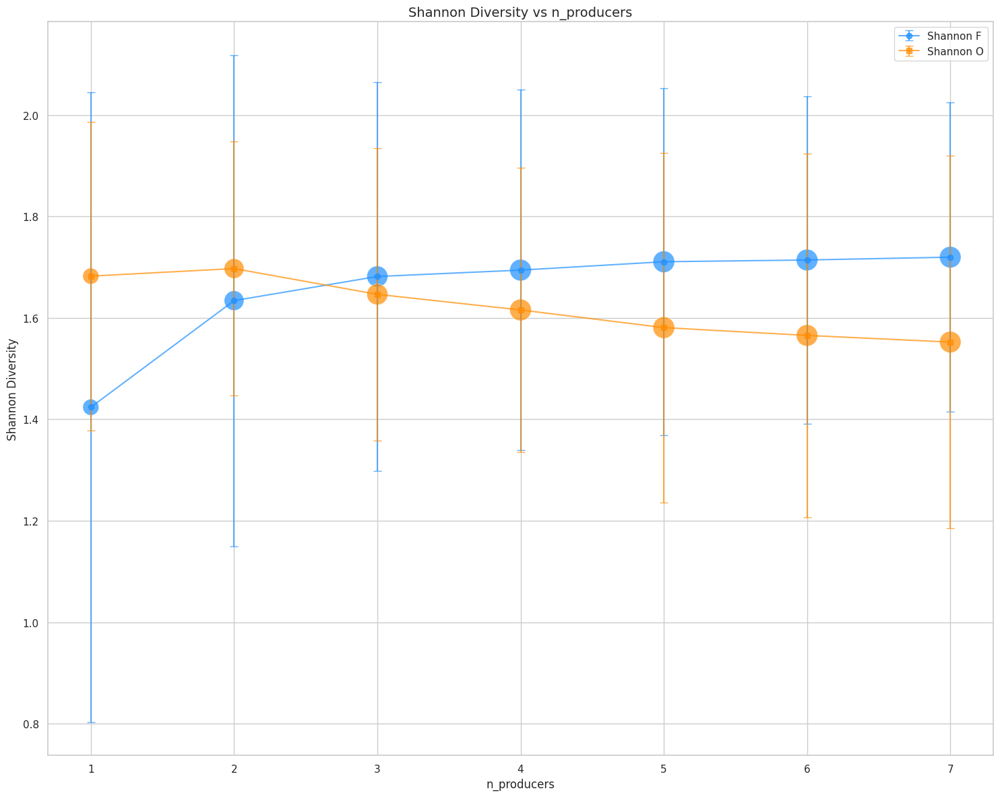

In [88]:
# Group the dataframe by 'n_produced' and calculate the mean, std, and count for Shannon diversity
grouped_data_produced = df_filtered.groupby('n_produced').agg(
    shannon_sp_avg=('shannon_F', 'mean'),
    shannon_sp_std=('shannon_F', 'std'),
    shannon_avg=('shannon_O', 'mean'),
    shannon_std=('shannon_O', 'std'),
    count=('shannon_F', 'size')  # Count the number of elements in each bin
).reset_index()

# Calculate marker sizes based on count
marker_sizes_produced = np.sqrt(grouped_data_produced['count']) * 30  # Adjust multiplier for appropriate scaling

# Set up the figure
plt.figure(figsize=(15, 12))

# Plot Shannon F with error bars, lines, and variable-sized points
plt.errorbar(
    grouped_data_produced['n_produced'], 
    grouped_data_produced['shannon_sp_avg'], 
    yerr=grouped_data_produced['shannon_sp_std'], 
    fmt='-o', color='DodgerBlue', label='Shannon F', alpha=0.7, capsize=4
)
plt.scatter(
    grouped_data_produced['n_produced'], 
    grouped_data_produced['shannon_sp_avg'], 
    s=marker_sizes_produced, color='DodgerBlue', alpha=0.7, edgecolor='w', linewidth=0.5
)

# Plot Shannon O with error bars, lines, and variable-sized points
plt.errorbar(
    grouped_data_produced['n_produced'], 
    grouped_data_produced['shannon_avg'], 
    yerr=grouped_data_produced['shannon_std'], 
    fmt='-s', color='DarkOrange', label='Shannon O', alpha=0.7, capsize=4
)
plt.scatter(
    grouped_data_produced['n_produced'], 
    grouped_data_produced['shannon_avg'], 
    s=marker_sizes_produced, color='DarkOrange', alpha=0.7, edgecolor='w', linewidth=0.5
)

# Add labels, title, and legend
plt.xlabel('n_producers', fontsize=12)
plt.ylabel('Shannon Diversity', fontsize=12)
plt.title('Shannon Diversity vs n_producers', fontsize=14)
plt.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

/tmp/ipykernel_2235615/2488360971.py:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=10)


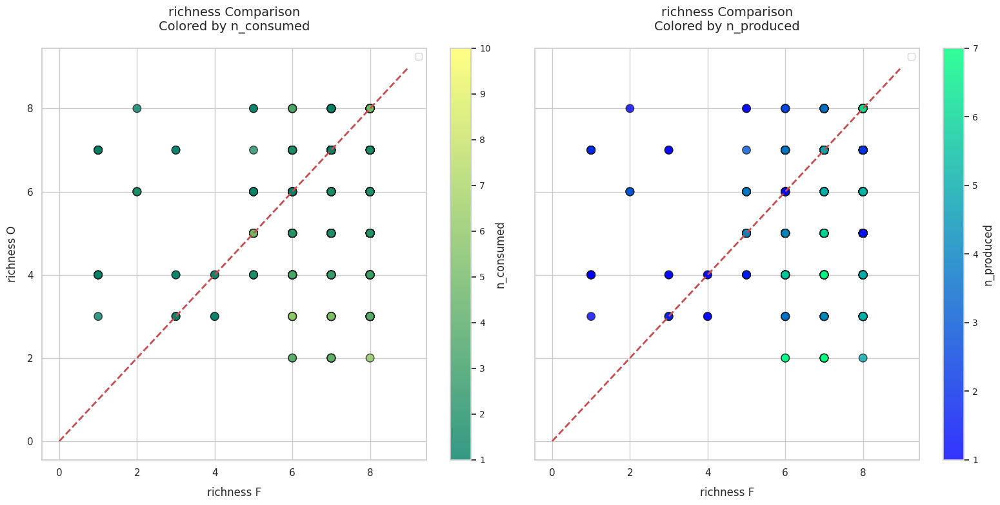

In [89]:
# Set seaborn style for a more polished look
sns.set(style='whitegrid')

# Create the figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)

# Scatter plot for n_consumed
sc1 = axes[0].scatter(
    df_filtered['richness_F'],      
    df_filtered['richness_O'],    
    c=df_filtered['n_consumed'],  
    cmap='summer',                
    s=80,                         
    edgecolor='k',                
    alpha=0.8                     
)

# Add a color bar for n_consumed
cbar1 = fig.colorbar(sc1, ax=axes[0])
cbar1.set_label('n_consumed', fontsize=12)
cbar1.ax.tick_params(labelsize=10)

# Scatter plot for n_produced
sc2 = axes[1].scatter(
    df_filtered['richness_F'],      
    df_filtered['richness_O'],    
    c=df_filtered['n_produced'],  
    cmap='winter',                
    s=80,                         
    edgecolor='k',                
    alpha=0.8                     
)

# Add a color bar for n_produced
cbar2 = fig.colorbar(sc2, ax=axes[1])
cbar2.set_label('n_produced', fontsize=12)
cbar2.ax.tick_params(labelsize=10)

# Add a diagonal line and max diversity lines to both subplots
for ax in axes:
    ax.plot([0., 9], [0., 9], 'r--', linewidth=2)
    ax.legend(fontsize=10)

# Add labels, titles, and gridlines for each subplot
axes[0].set_title('richness Comparison\nColored by n_consumed', fontsize=14, pad=20)
axes[0].set_xlabel('richness F', fontsize=12, labelpad=10)
axes[0].set_ylabel('richness O', fontsize=12, labelpad=10)

axes[1].set_title('richness Comparison\nColored by n_produced', fontsize=14, pad=20)
axes[1].set_xlabel('richness F', fontsize=12, labelpad=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## Separate visualization

/tmp/ipykernel_2235615/3489730482.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = current_data.groupby('n_consumed').agg(
/tmp/ipykernel_2235615/3489730482.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = current_data.groupby('n_consumed').agg(
/tmp/ipykernel_2235615/3489730482.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = current_data.groupby('n_consumed').agg

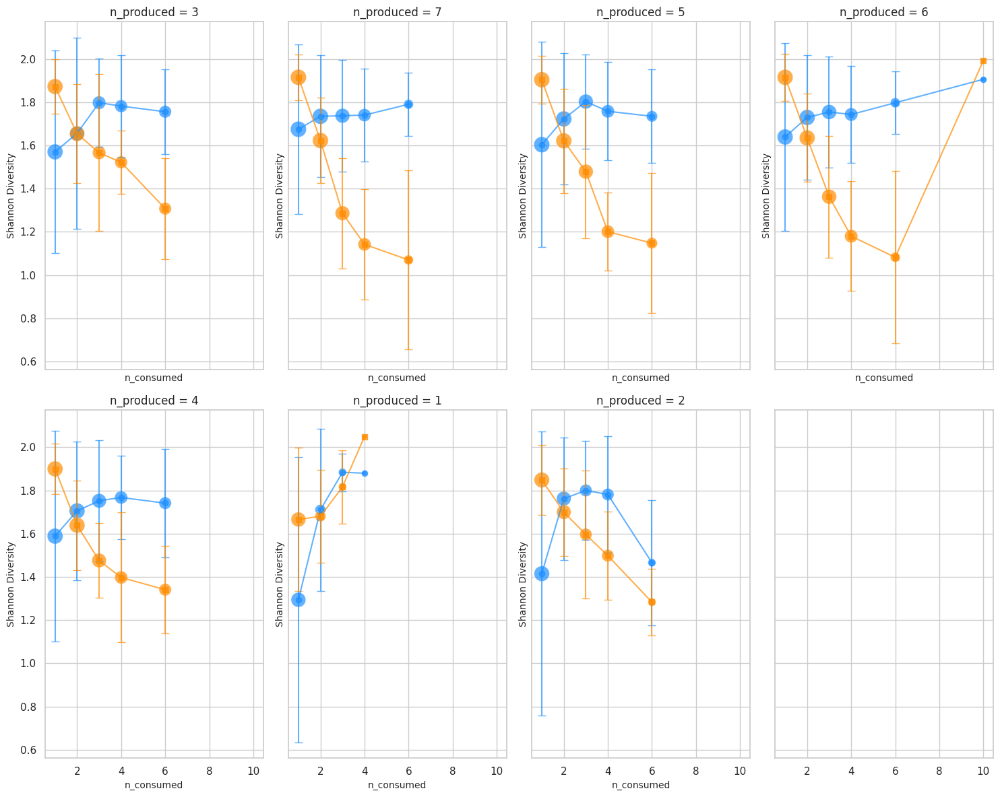

In [90]:
# Create a figure with subplots for each unique value of 'n_produced'
unique_n_produced = df_filtered['n_produced'].unique()

# Choose number of rows and columns
n_rows = 2
n_cols = int(np.ceil(len(unique_n_produced) / n_rows))  # Calculate columns based on the number of rows

# Set up the figure for subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 12), sharex=True, sharey=True)

# Flatten axes array for easier indexing
axes = axes.flatten()

# Loop through each unique 'n_produced' and plot on a separate subplot
for i, n_prod in enumerate(unique_n_produced):
    # Filter data for the current 'n_produced' value
    current_data = df_filtered[df_filtered['n_produced'] == n_prod]
    
    # Group by 'n_consumed' for the current data
    grouped_data = current_data.groupby('n_consumed').agg(
        shannon_sp_avg=('shannon_F', 'mean'),
        shannon_sp_std=('shannon_F', 'std'),
        shannon_avg=('shannon_O', 'mean'),
        shannon_std=('shannon_O', 'std'),
        count=('shannon_F', 'size')
    ).reset_index()

    # Calculate marker sizes based on count
    marker_sizes = np.sqrt(grouped_data['count']) * 30  # Adjust multiplier for appropriate scaling

    # Plot Shannon F with error bars and variable-sized points
    axes[i].errorbar(
        grouped_data['n_consumed'], 
        grouped_data['shannon_sp_avg'], 
        yerr=grouped_data['shannon_sp_std'], 
        fmt='-o', color='DodgerBlue', label='Shannon F', alpha=0.7, capsize=4
    )
    axes[i].scatter(
        grouped_data['n_consumed'], 
        grouped_data['shannon_sp_avg'], 
        s=marker_sizes, color='DodgerBlue', alpha=0.7, edgecolor='w', linewidth=0.5
    )

    # Plot Shannon O with error bars and variable-sized points
    axes[i].errorbar(
        grouped_data['n_consumed'], 
        grouped_data['shannon_avg'], 
        yerr=grouped_data['shannon_std'], 
        fmt='-s', color='DarkOrange', label='Shannon O', alpha=0.7, capsize=4
    )
    axes[i].scatter(
        grouped_data['n_consumed'], 
        grouped_data['shannon_avg'], 
        s=marker_sizes, color='DarkOrange', alpha=0.7, edgecolor='w', linewidth=0.5
    )
    
    axes[i].set_title(f'n_produced = {n_prod}', fontsize=12)
    axes[i].set_xlabel('n_consumed', fontsize=10)
    axes[i].set_ylabel('Shannon Diversity', fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

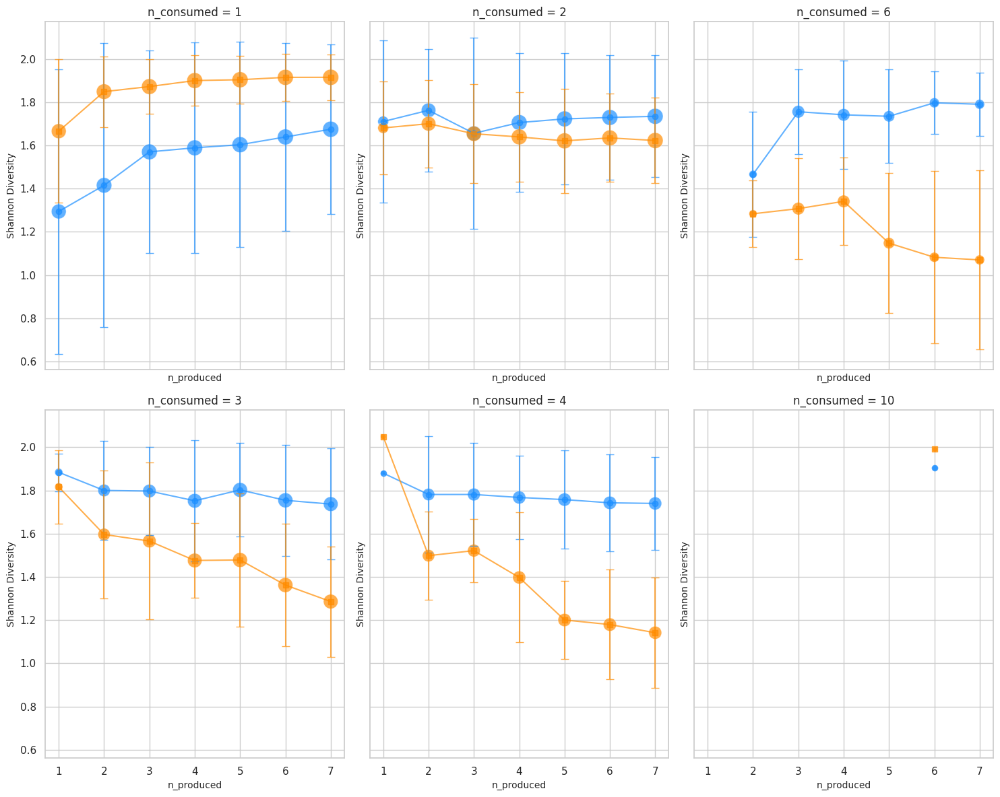

In [91]:
# Create a figure with subplots for each unique value of 'n_consumed'
unique_n_consumed = df_filtered['n_consumed'].unique()

# Choose number of rows and columns
n_rows = 2
n_cols = int(np.ceil(len(unique_n_consumed) / n_rows))  # Calculate columns based on the number of rows

# Set up the figure for subplots
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 12), sharex=True, sharey=True)

# Flatten axes array for easier indexing
axes = axes.flatten()

# Loop through each unique 'n_consumed' and plot on a separate subplot
for i, n_cons in enumerate(unique_n_consumed):
    # Filter data for the current 'n_consumed' value
    current_data = df_filtered[df_filtered['n_consumed'] == n_cons]
    
    # Group by 'n_produced' for the current data
    grouped_data = current_data.groupby('n_produced').agg(
        shannon_sp_avg=('shannon_F', 'mean'),
        shannon_sp_std=('shannon_F', 'std'),
        shannon_avg=('shannon_O', 'mean'),
        shannon_std=('shannon_O', 'std'),
        count=('shannon_F', 'size')
    ).reset_index()

    # Calculate marker sizes based on count
    marker_sizes = np.sqrt(grouped_data['count']) * 30  # Adjust multiplier for appropriate scaling

    # Plot Shannon F with error bars and variable-sized points
    axes[i].errorbar(
        grouped_data['n_produced'], 
        grouped_data['shannon_sp_avg'], 
        yerr=grouped_data['shannon_sp_std'], 
        fmt='-o', color='DodgerBlue', label='Shannon F', alpha=0.7, capsize=4
    )
    axes[i].scatter(
        grouped_data['n_produced'], 
        grouped_data['shannon_sp_avg'], 
        s=marker_sizes, color='DodgerBlue', alpha=0.7, edgecolor='w', linewidth=0.5
    )

    # Plot Shannon O with error bars and variable-sized points
    axes[i].errorbar(
        grouped_data['n_produced'], 
        grouped_data['shannon_avg'], 
        yerr=grouped_data['shannon_std'], 
        fmt='-s', color='DarkOrange', label='Shannon O', alpha=0.7, capsize=4
    )
    axes[i].scatter(
        grouped_data['n_produced'], 
        grouped_data['shannon_avg'], 
        s=marker_sizes, color='DarkOrange', alpha=0.7, edgecolor='w', linewidth=0.5
    )
    
    axes[i].set_title(f'n_consumed = {n_cons}', fontsize=12)
    axes[i].set_xlabel('n_produced', fontsize=10)
    axes[i].set_ylabel('Shannon Diversity', fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

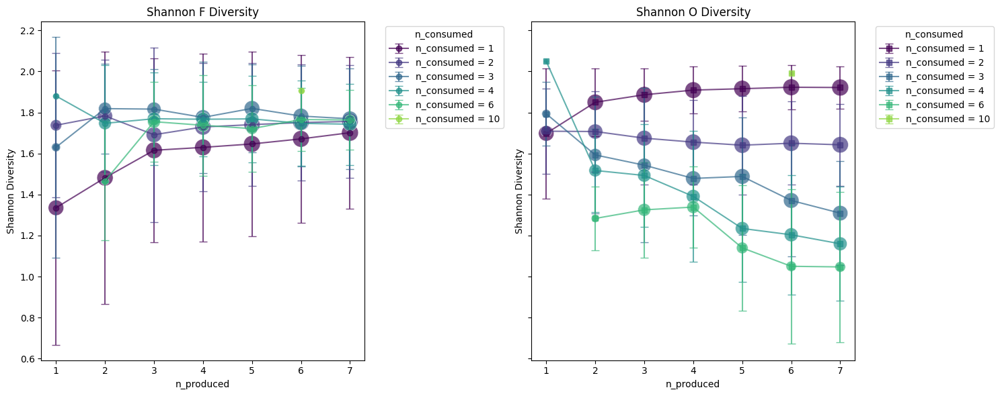

In [18]:
import matplotlib.colors as mcolors

# Assuming df_filtered is your DataFrame containing the data
unique_n_consumed = df_filtered['n_consumed'].unique()

# Sort the 'n_consumed' values so colors are assigned in increasing order
unique_n_consumed = np.sort(unique_n_consumed)

# Set up the figure with two subplots (one for Shannon F, one for Shannon O)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6), sharex=True, sharey=True)

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(unique_n_consumed)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each unique 'n_consumed' and plot data for Shannon F and Shannon O
for i, n_cons in enumerate(unique_n_consumed):
    # Filter data for the current 'n_consumed' value
    current_data = df_filtered[df_filtered['n_consumed'] == n_cons]
    
    # Group by 'n_produced' for the current data
    grouped_data = current_data.groupby('n_produced').agg(
        shannon_sp_avg=('shannon_F', 'mean'),
        shannon_sp_std=('shannon_F', 'std'),
        shannon_avg=('shannon_O', 'mean'),
        shannon_std=('shannon_O', 'std'),
        count=('shannon_F', 'size')
    ).reset_index()

    # Calculate marker sizes based on count
    marker_sizes = np.sqrt(grouped_data['count']) * 30  # Adjust multiplier for appropriate scaling
    
    # Plot Shannon F on the first subplot
    axes[0].errorbar(
        grouped_data['n_produced'], 
        grouped_data['shannon_sp_avg'], 
        yerr=grouped_data['shannon_sp_std'], 
        fmt='-o', color=colors[i], label=f'n_consumed = {n_cons}', alpha=0.7, capsize=4
    )
    axes[0].scatter(
        grouped_data['n_produced'], 
        grouped_data['shannon_sp_avg'], 
        s=marker_sizes, color=colors[i], alpha=0.7, edgecolor='w', linewidth=0.5
    )
    
    # Plot Shannon O on the second subplot
    axes[1].errorbar(
        grouped_data['n_produced'], 
        grouped_data['shannon_avg'], 
        yerr=grouped_data['shannon_std'], 
        fmt='-s', color=colors[i], label=f'n_consumed = {n_cons}', alpha=0.7, capsize=4
    )
    axes[1].scatter(
        grouped_data['n_produced'], 
        grouped_data['shannon_avg'], 
        s=marker_sizes, color=colors[i], alpha=0.7, edgecolor='w', linewidth=0.5
    )

# Add titles and labels
axes[0].set_title('Shannon F Diversity', fontsize=12)
axes[1].set_title('Shannon O Diversity', fontsize=12)
for ax in axes:
    ax.set_xlabel('n_produced', fontsize=10)
    ax.set_ylabel('Shannon Diversity', fontsize=10)
    
# Add a legend
axes[0].legend(title="n_consumed", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
axes[1].legend(title="n_consumed", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

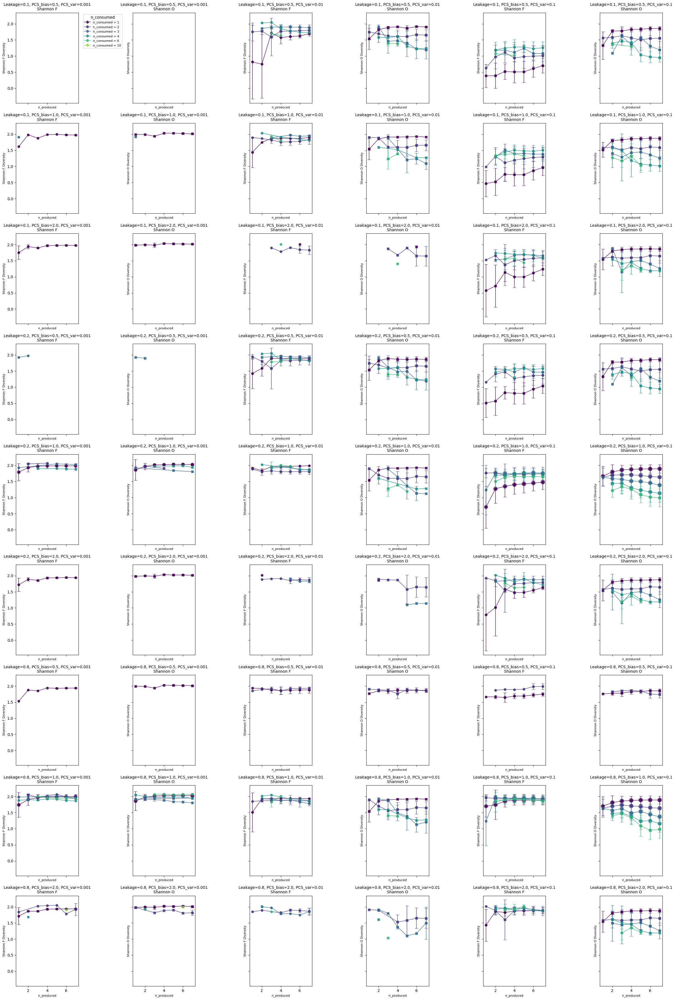

In [23]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Generate parameter combinations
leakage_values  = sorted(df_filtered['leakage'].unique())
PCS_bias_values = sorted(df_filtered['PCS_bias'].unique())
PCS_var_values  = sorted(df_filtered['PCS_var'].unique())
combinations = list(itertools.product(leakage_values, PCS_bias_values, PCS_var_values))

# Set up the figure with 27 subplots (each with 2 panels)
fig, axes = plt.subplots(nrows=len(leakage_values) * len(PCS_bias_values), ncols=len(PCS_var_values) * 2, figsize=(24, 36), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(unique_n_consumed)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each parameter combination and create plots
for idx, (leakage, PCS_bias, PCS_var) in enumerate(combinations):
    # Calculate the row and column indices based on leakage, PCS_var, and PCS_bias
    row_idx = leakage_values.index(leakage) * len(PCS_bias_values) + PCS_bias_values.index(PCS_bias)
    col_idx = PCS_var_values.index(PCS_var) * 2
    
    # Filter data for the current combination
    combo_data = df_filtered[
        (df_filtered['leakage'] == leakage) &
        (df_filtered['PCS_bias'] == PCS_bias) &
        (df_filtered['PCS_var'] == PCS_var)
    ]
    
    # Prepare axes for Shannon F and Shannon O
    ax_F = axes[row_idx * len(PCS_var_values) * 2 + col_idx]      # First panel for Shannon F
    ax_O = axes[row_idx * len(PCS_var_values) * 2 + col_idx + 1]  # Second panel for Shannon O
    
    # Loop through each unique 'n_consumed' and plot data for Shannon F and O
    for i, n_cons in enumerate(unique_n_consumed):
        current_data = combo_data[combo_data['n_consumed'] == n_cons]
        grouped_data = current_data.groupby('n_produced').agg(
            shannon_sp_avg=('shannon_F', 'mean'),
            shannon_sp_std=('shannon_F', 'std'),
            shannon_avg=('shannon_O', 'mean'),
            shannon_std=('shannon_O', 'std'),
            count=('shannon_F', 'size')
        ).reset_index()
        
        # Calculate marker sizes
        marker_sizes = np.sqrt(grouped_data['count']) * 30
        
        # Plot Shannon F
        ax_F.errorbar(
            grouped_data['n_produced'], 
            grouped_data['shannon_sp_avg'], 
            yerr=grouped_data['shannon_sp_std'], 
            fmt='-o', color=colors[i], label=f'n_consumed = {n_cons}', alpha=0.7, capsize=4
        )
        ax_F.scatter(
            grouped_data['n_produced'], 
            grouped_data['shannon_sp_avg'], 
            s=marker_sizes, color=colors[i], alpha=0.7, edgecolor='w', linewidth=0.5
        )
        
        # Plot Shannon O
        ax_O.errorbar(
            grouped_data['n_produced'], 
            grouped_data['shannon_avg'], 
            yerr=grouped_data['shannon_std'], 
            fmt='-s', color=colors[i], label=f'n_consumed = {n_cons}', alpha=0.7, capsize=4
        )
        ax_O.scatter(
            grouped_data['n_produced'], 
            grouped_data['shannon_avg'], 
            s=marker_sizes, color=colors[i], alpha=0.7, edgecolor='w', linewidth=0.5
        )
    
    # Set titles for the current parameter combination
    ax_F.set_title(f'Leakage={leakage}, PCS_bias={PCS_bias}, PCS_var={PCS_var}\nShannon F', fontsize=10)
    ax_O.set_title(f'Leakage={leakage}, PCS_bias={PCS_bias}, PCS_var={PCS_var}\nShannon O', fontsize=10)
    
    # Set axis labels
    ax_F.set_xlabel('n_produced', fontsize=8)
    ax_F.set_ylabel('Shannon F Diversity', fontsize=8)
    ax_O.set_xlabel('n_produced', fontsize=8)
    ax_O.set_ylabel('Shannon O Diversity', fontsize=8)

# Add a legend to the first panel
axes[0].legend(title="n_consumed", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

# Adjust layout and display
plt.tight_layout()
plt.show()

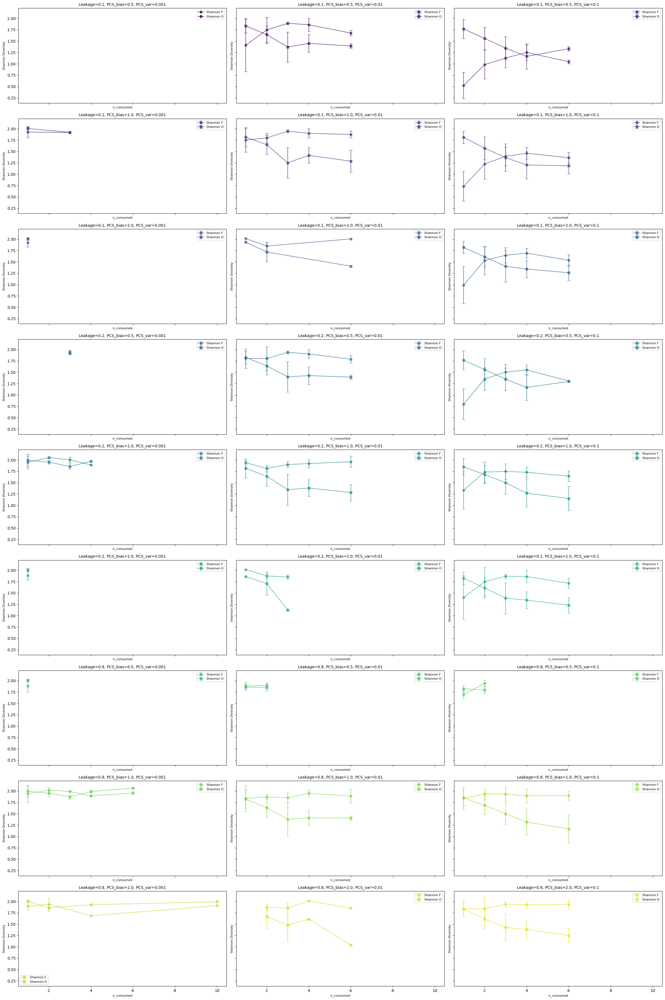

In [24]:
combinations = list(itertools.product(leakage_values, PCS_bias_values, PCS_var_values))

# Set up the figure with 27 subplots (each with 1 panel)
fig, axes = plt.subplots(nrows=9, ncols=3, figsize=(24, 36), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(combinations)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each parameter combination and create plots
for idx, (leakage, PCS_bias, PCS_var) in enumerate(combinations):
    # Filter data for the current combination
    combo_data = df_filtered[
        (df_filtered['leakage'] == leakage) &
        (df_filtered['PCS_bias'] == PCS_bias) &
        (df_filtered['PCS_var'] == PCS_var)
    ]
    
    # Group by 'n_consumed' and calculate mean and std over 'n_produced'
    grouped_data = combo_data.groupby('n_consumed', observed=True).agg(
        shannon_F_avg=('shannon_F', 'mean'),
        shannon_F_std=('shannon_F', 'std'),
        shannon_O_avg=('shannon_O', 'mean'),
        shannon_O_std=('shannon_O', 'std'),
        count=('shannon_F', 'size')
    ).reset_index()
    
    # Prepare axes for Shannon F and Shannon O
    ax = axes[idx]  # Single panel for each parameter combination
    
    # Plot Shannon F
    ax.errorbar(
        grouped_data['n_consumed'], 
        grouped_data['shannon_F_avg'], 
        yerr=grouped_data['shannon_F_std'], 
        fmt='-o', color=colors[idx], label='Shannon F', alpha=0.7, capsize=4
    )
    
    # Plot Shannon O
    ax.errorbar(
        grouped_data['n_consumed'], 
        grouped_data['shannon_O_avg'], 
        yerr=grouped_data['shannon_O_std'], 
        fmt='-s', color=colors[idx], label='Shannon O', alpha=0.7, capsize=4
    )
    
    # Set titles for the current parameter combination
    ax.set_title(f'Leakage={leakage}, PCS_bias={PCS_bias}, PCS_var={PCS_var}', fontsize=10)
    
    # Set axis labels
    ax.set_xlabel('n_consumed', fontsize=8)
    ax.set_ylabel('Shannon Diversity', fontsize=8)
    
    # Add legend
    ax.legend(fontsize=8)

# Adjust layout and display
plt.tight_layout()
plt.show()

## interesting subset

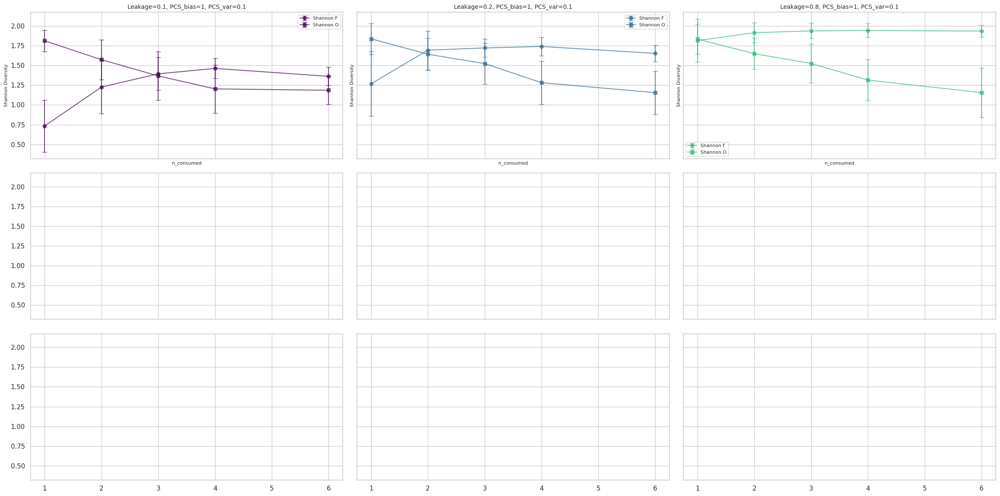

In [109]:
# Generate parameter combinations but filter for PCS_var=0.1 and PCS_bias=1
leakage_values = df_filtered['leakage'].unique()
PCS_var_value = 0.1
PCS_bias_value = 1
combinations = [(leakage, PCS_bias_value, PCS_var_value) for leakage in leakage_values]

# Set up the figure with 9 subplots (since only PCS_var=0.1 and PCS_bias=1 is considered)
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 12), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
n_colors = len(combinations)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each leakage value and create plots
for idx, (leakage, PCS_bias, PCS_var) in enumerate(combinations):
    # Filter data for the current combination
    combo_data = df_filtered[
        (df_filtered['leakage'] == leakage) &
        (df_filtered['PCS_bias'] == PCS_bias) &
        (df_filtered['PCS_var'] == PCS_var)
    ]
    
    # Group by 'n_consumed' and calculate mean and std over 'n_produced'
    grouped_data = combo_data.groupby('n_consumed', observed=True).agg(
        shannon_F_avg=('shannon_F', 'mean'),
        shannon_F_std=('shannon_F', 'std'),
        shannon_O_avg=('shannon_O', 'mean'),
        shannon_O_std=('shannon_O', 'std'),
        count=('shannon_F', 'size')
    ).reset_index()
    
    # Prepare axes for Shannon F and Shannon O
    ax = axes[idx]  # Single panel for each parameter combination
    
    # Plot Shannon F
    ax.errorbar(
        grouped_data['n_consumed'], 
        grouped_data['shannon_F_avg'], 
        yerr=grouped_data['shannon_F_std'], 
        fmt='-o', color=colors[idx], label='Shannon F', alpha=0.7, capsize=4
    )
    
    # Plot Shannon O
    ax.errorbar(
        grouped_data['n_consumed'], 
        grouped_data['shannon_O_avg'], 
        yerr=grouped_data['shannon_O_std'], 
        fmt='-s', color=colors[idx], label='Shannon O', alpha=0.7, capsize=4
    )
    
    # Set titles for the current parameter combination
    ax.set_title(f'Leakage={leakage}, PCS_bias={PCS_bias}, PCS_var={PCS_var}', fontsize=10)
    
    # Set axis labels
    ax.set_xlabel('n_consumed', fontsize=8)
    ax.set_ylabel('Shannon Diversity', fontsize=8)
    
    # Add legend
    ax.legend(fontsize=8)

# Adjust layout and display
plt.tight_layout()
plt.show()

## leakage influence

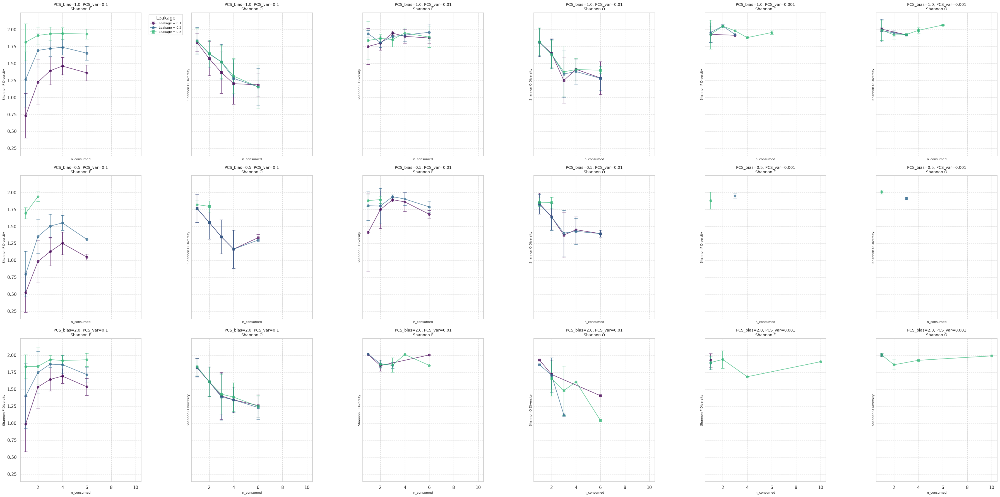

In [95]:
# Generate parameter combinations excluding leakage
PCS_bias_values = df_filtered['PCS_bias'].unique()
PCS_var_values = df_filtered['PCS_var'].unique()
combinations = list(itertools.product(PCS_bias_values, PCS_var_values))

# Set up the figure with double the columns (one for Shannon F and one for Shannon O)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(36, 18), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
leakage_values = np.sort(df_filtered['leakage'].unique())
n_colors = len(leakage_values)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each parameter combination and create plots for both Shannon F and Shannon O
for idx, (PCS_bias, PCS_var) in enumerate(combinations):
    # Prepare axes for Shannon F and Shannon O
    ax_F = axes[idx * 2]      # First panel for Shannon F
    ax_O = axes[idx * 2 + 1]  # Second panel for Shannon O
    
    # Loop through each unique leakage value and plot data
    for color_idx, leakage in enumerate(leakage_values):
        # Filter data for the current combination
        combo_data = df_filtered[
            (df_filtered['leakage'] == leakage) &
            (df_filtered['PCS_bias'] == PCS_bias) &
            (df_filtered['PCS_var'] == PCS_var)
        ]
        
        # Group by 'n_consumed' and calculate mean and std over 'n_produced'
        grouped_data = combo_data.groupby('n_consumed', observed=True).agg(
            shannon_F_avg=('shannon_F', 'mean'),
            shannon_F_std=('shannon_F', 'std'),
            shannon_O_avg=('shannon_O', 'mean'),
            shannon_O_std=('shannon_O', 'std'),
            count=('shannon_F', 'size')
        ).reset_index()
        
        # Plot Shannon F
        ax_F.errorbar(
            grouped_data['n_consumed'], 
            grouped_data['shannon_F_avg'], 
            yerr=grouped_data['shannon_F_std'], 
            fmt='-o', color=colors[color_idx], label=f'Leakage = {leakage}', alpha=0.7, capsize=4
        )
        
        # Plot Shannon O
        ax_O.errorbar(
            grouped_data['n_consumed'], 
            grouped_data['shannon_O_avg'], 
            yerr=grouped_data['shannon_O_std'], 
            fmt='-s', color=colors[color_idx], label=f'Leakage = {leakage}', alpha=0.7, capsize=4
        )
    
    # Set titles for the current parameter combination
    ax_F.set_title(f'PCS_bias={PCS_bias}, PCS_var={PCS_var}\nShannon F', fontsize=10)
    ax_O.set_title(f'PCS_bias={PCS_bias}, PCS_var={PCS_var}\nShannon O', fontsize=10)
    
    # Set axis labels
    ax_F.set_xlabel('n_consumed', fontsize=8)
    ax_F.set_ylabel('Shannon F Diversity', fontsize=8)
    ax_O.set_xlabel('n_consumed', fontsize=8)
    ax_O.set_ylabel('Shannon O Diversity', fontsize=8)
    
    # Add grid lines
    ax_F.grid(True, linestyle='--', alpha=0.7)
    ax_O.grid(True, linestyle='--', alpha=0.7)

# Add a legend to the first panel
axes[0].legend(title="Leakage", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

# Adjust layout and display
plt.tight_layout()
plt.show()

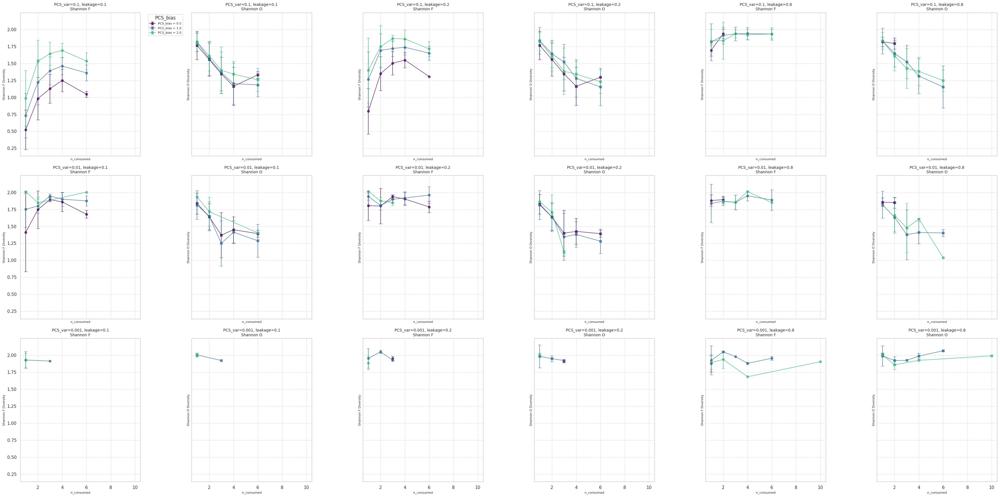

In [96]:
# Generate parameter combinations excluding leakage
PCS_bias_values = df_filtered['PCS_bias'].unique()
PCS_var_values = df_filtered['PCS_var'].unique()
combinations = list(itertools.product(PCS_var_values, df_filtered['leakage'].unique()))

# Set up the figure with double the columns (one for Shannon F and one for Shannon O)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(36, 18), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten the axes for easier iteration

# Define a discrete version of the 'viridis' colormap with enough distinct colors
PCS_bias_values_sorted = np.sort(PCS_bias_values)
n_colors = len(PCS_bias_values_sorted)
cmap = plt.cm.viridis  # Use 'viridis' colormap
colors = [cmap(i / n_colors) for i in range(n_colors)]  # Discretize the colormap

# Loop through each parameter combination and create plots for both Shannon F and Shannon O
for idx, (PCS_var, leakage) in enumerate(combinations):
    # Prepare axes for Shannon F and Shannon O
    ax_F = axes[idx * 2]      # First panel for Shannon F
    ax_O = axes[idx * 2 + 1]  # Second panel for Shannon O
    
    # Loop through each unique PCS_bias value and plot data
    for color_idx, PCS_bias in enumerate(PCS_bias_values_sorted):
        # Filter data for the current combination
        combo_data = df_filtered[
            (df_filtered['PCS_bias'] == PCS_bias) &
            (df_filtered['PCS_var'] == PCS_var) &
            (df_filtered['leakage'] == leakage)
        ]
        
        # Group by 'n_consumed' and calculate mean and std over 'n_produced'
        grouped_data = combo_data.groupby('n_consumed', observed=True).agg(
            shannon_F_avg=('shannon_F', 'mean'),
            shannon_F_std=('shannon_F', 'std'),
            shannon_O_avg=('shannon_O', 'mean'),
            shannon_O_std=('shannon_O', 'std'),
            count=('shannon_F', 'size')
        ).reset_index()
        
        # Plot Shannon F
        ax_F.errorbar(
            grouped_data['n_consumed'], 
            grouped_data['shannon_F_avg'], 
            yerr=grouped_data['shannon_F_std'], 
            fmt='-o', color=colors[color_idx], label=f'PCS_bias = {PCS_bias}', alpha=0.7, capsize=4
        )
        
        # Plot Shannon O
        ax_O.errorbar(
            grouped_data['n_consumed'], 
            grouped_data['shannon_O_avg'], 
            yerr=grouped_data['shannon_O_std'], 
            fmt='-s', color=colors[color_idx], label=f'PCS_bias = {PCS_bias}', alpha=0.7, capsize=4
        )
    
    # Set titles for the current parameter combination
    ax_F.set_title(f'PCS_var={PCS_var}, leakage={leakage}\nShannon F', fontsize=10)
    ax_O.set_title(f'PCS_var={PCS_var}, leakage={leakage}\nShannon O', fontsize=10)
    
    # Set axis labels
    ax_F.set_xlabel('n_consumed', fontsize=8)
    ax_F.set_ylabel('Shannon F Diversity', fontsize=8)
    ax_O.set_xlabel('n_consumed', fontsize=8)
    ax_O.set_ylabel('Shannon O Diversity', fontsize=8)
    
    # Add grid lines
    ax_F.grid(True, linestyle='--', alpha=0.7)
    ax_O.grid(True, linestyle='--', alpha=0.7)

# Add a legend to the first panel
axes[0].legend(title="PCS_bias", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

# Adjust layout and display
plt.tight_layout()
plt.show()